---
#Set Up
---

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [ ]:
import numpy as np
import os
import pickle
import matplotlib.pyplot as plt
import cv2
import imutils
import sklearn.metrics
#Tensorflow Keras

from keras import layers,models,optimizers,preprocessing, applications
from keras.models import Sequential, load_model #libreria necesaria para apilar o alinear una serie de capas con la que crearemos las redes neuronales
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D #capas que usaremos
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_curve, auc
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from keras.utils.np_utils import to_categorical 

In [ ]:
main_dir = "/content/drive/MyDrive/tfg/tumor-classificator/Total"
classes = ["glioma_tumor", "meningioma_tumor", "no_tumor", "pituitary_tumor"]
resolution = 128
epochs=50
batch_size=20

#Proccess and save images
def load_images():
  
  X_colored = []
  X_grayscale = []
  y = []
    
  for label, actual_class in enumerate(classes):
    print(f"loading from Total class {actual_class}")
    sub_dir_path = os.path.join(main_dir, actual_class)
    for image_name in os.listdir(sub_dir_path):
      image_path = os.path.join(sub_dir_path, image_name)
      #save images as rgb mode and resize to 128x128
      image_colored = preprocessing.image.load_img(image_path, color_mode="rgb", target_size=(resolution, resolution))
      #save images as grayscale mode and resize to 128x128
      image_grayscale = preprocessing.image.load_img(image_path, color_mode="grayscale", target_size=(resolution, resolution))
      #save in respectives arrays in order
      X_colored.append(preprocessing.image.img_to_array(image_colored))
      X_grayscale.append(preprocessing.image.img_to_array(image_grayscale))
      #save labels per image 
      y.append(label)

  #normalize data
  X_colored = np.array(X_colored) / 255.0
  X_grayscale = np.array(X_grayscale) / 255.0
  y = np.array(y)
    
  return X_colored, X_grayscale, y

In [ ]:
X_colored, X_grayscale, y = load_images()

loading from Total class glioma_tumor
loading from Total class meningioma_tumor
loading from Total class no_tumor
loading from Total class pituitary_tumor


In [ ]:
# convert to one-hot-encoding
y = to_categorical(y, num_classes = 4)

In [ ]:
#divide images in 3 batchs train, validation and test by colors
X_train_rgb, X_val_rgb, y_train_rgb, y_val_rgb = train_test_split(X_colored, y, test_size = 0.2, random_state=132)
X_train_rgb, X_test_rgb, y_train_rgb, y_test_rgb = train_test_split(X_train_rgb, y_train_rgb, test_size = 0.1, random_state=132)

X_train_gs, X_val_gs, y_train_gs, y_val_gs = train_test_split(X_grayscale, y, test_size = 0.2, random_state=132)
X_train_gs, X_test_gs, y_train_gs, y_test_gs = train_test_split(X_train_gs, y_train_gs, test_size = 0.1, random_state=132)

---
#Plotting Data
---

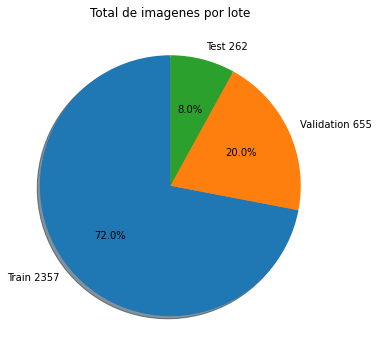

In [ ]:
image_quantity = [X_train_gs.shape[0], X_val_gs.shape[0], X_test_gs.shape[0]]

plt.figure(figsize=(6,6))
plt.pie(image_quantity, labels=[f"Train {X_train_gs.shape[0]}", f"Validation {X_val_gs.shape[0]}", 
                                f"Test {X_test_gs.shape[0]}"], autopct='%1.1f%%', shadow=True, startangle=90)
plt.title("Total de imagenes por lote")
plt.show()

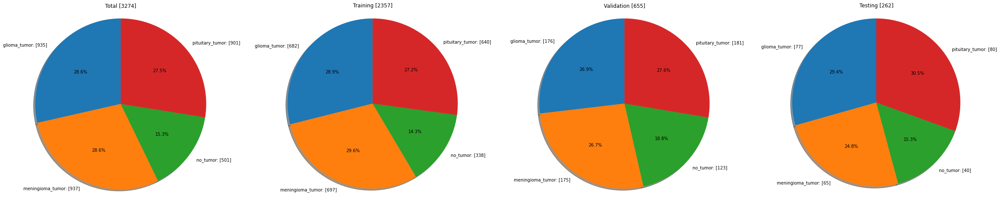

In [ ]:
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
def get_quantity(set_labels):
  quantity = [0, 0 , 0, 0]
  for labels in set_labels:
    quantity[np.argmax(labels)] = quantity[np.argmax(labels)] + 1
  return quantity

splits = [(y,"Total"), (y_train_gs,"Training"), (y_val_gs,"Validation"), (y_test_gs,"Testing")]
fig, subplots = plt.subplots(1, len(splits))
fig.set_size_inches(40, 8)

for i in range(0,len(splits)):
  quantity= get_quantity(splits[i][0])
  classes_plus_quantity= [f"{classes[i]}: [{quantity[i]}]" for i in range(0,len(classes))]
  subplots[i].pie(get_quantity(splits[i][0]), labels=classes_plus_quantity, autopct='%1.1f%%', shadow=True, startangle=90)
  subplots[i].axis('equal')
  subplots[i].set_title(f"{splits[i][1]} [{splits[i][0].shape[0]}]")
plt.show()

In [ ]:
def plot_data_augmentation(image_path, class_name):
  data_generator = ImageDataGenerator(
    rotation_range=10,
    zoom_range=[0.5,1.0],
    width_shift_range=0.15,  
    height_shift_range=0.15,  
    horizontal_flip=True
  )
  img = load_img(image_path)
  data = img_to_array(img)
  # expand dimension to one sample
  samples = np.expand_dims(data, 0)
  # prepare iterator

  plt.figure(figsize=(10,10))
  it = data_generator.flow(samples, batch_size=1)
  for i in range(9):
    plt.subplot(330 + 1 + i)
    # generate batch of images
    batch = it.next()
    # convert to unsigned integers for viewing
    image = batch[0].astype('uint8')
    plt.imshow(image)
    plt.axis("off")
  # Save images as svg (TFG required)
  plt.savefig("Data_Augmentation_" + class_name + ".svg")
  plt.show()

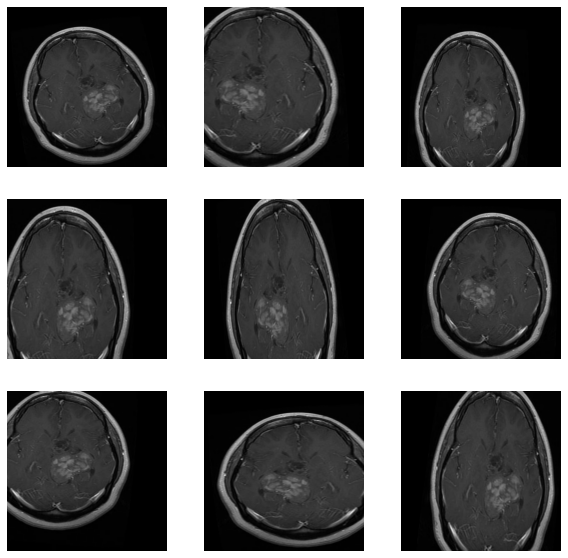

In [ ]:
plot_data_augmentation('/content/drive/MyDrive/tfg/tumor-classificator/Training/glioma_tumor/gg (1).jpg', 'Glioma_Tumor')

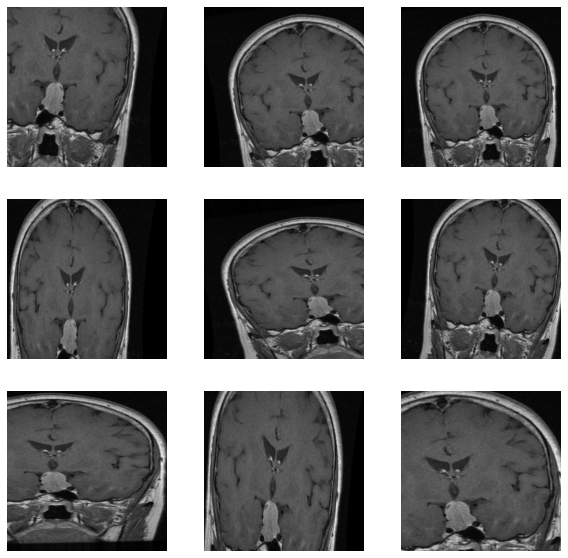

In [ ]:
plot_data_augmentation('/content/drive/MyDrive/tfg/tumor-classificator/Training/pituitary_tumor/p (100).jpg', 'Pituitary_Tumor')

---
#Predict and Plot Images
---

In [ ]:
def take_two_images(set_labels, index):
  res = [0,0]
  actual_index=0;
  count = 0
  for data in set_labels:
    if np.argmax(data) == index:
      res[count] = actual_index;
      count = count + 1;
      if count == 2:
        return res;
    actual_index = actual_index + 1

In [ ]:
def plot_images(set_labels, set_images, make_prediction):
  fig, subplots = plt.subplots(2, len(classes))
  fig.set_size_inches(30, 10)

  for i in range(0,len(classes)):
    indeces = take_two_images(set_labels, i)
    subplots[0][i].imshow(set_images[indeces[0]].reshape((resolution, resolution)))
    subplots[1][i].imshow(set_images[indeces[1]].reshape((resolution, resolution)), cmap="gray")
    if make_prediction:
      predict = model.predict(np.array([set_images[indeces[0]],]))
      num = np.argmax(predict)
      subplots[0][i].set_title(f"Real Label: {classes[i]}, Prediction: {classes[num]}")
      predict = model.predict(np.array([set_images[indeces[1]],]))
      num = np.argmax(predict)
      subplots[1][i].set_title(f"Real Label: {classes[i]}, Prediction: {classes[num]}")
    else:
      subplots[0][i].set_title(classes[i])
      subplots[1][i].set_title(classes[i])
  plt.show()

model = load_model('/content/drive/MyDrive/tfg/results/CNN/GS/Normal/modelCNN_gs.h')
model.compile(optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999), loss = "categorical_crossentropy", metrics=["accuracy"]) 

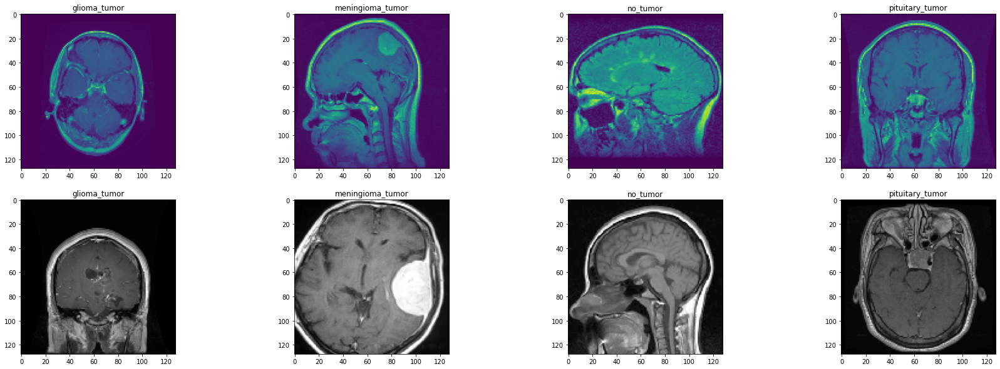

In [ ]:
plot_images(y_train_gs, X_train_gs, False)

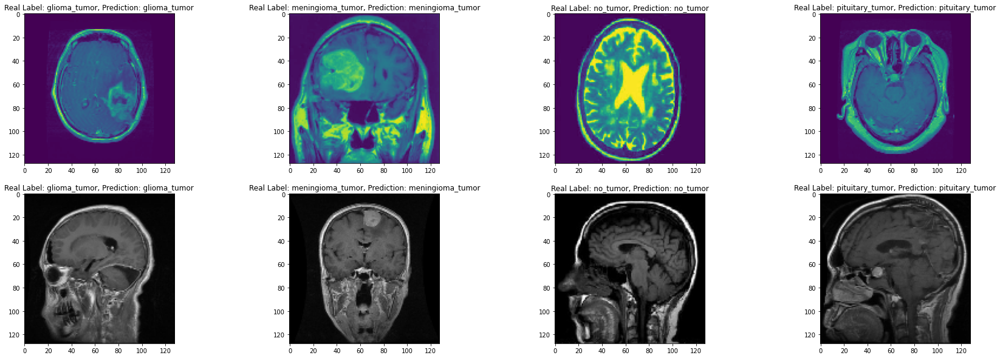

In [ ]:
plot_images(y_test_gs, X_test_gs, True)

---
#Confusion Matrix
---

In [ ]:
# Auxiliar function that is use to make the prediction 
# over the test set depends on the Channels contained on the names.
def predicts(model, name): 
  if "GS" in name: 
    predictions = model.predict(X_test_gs)
  else:
    predictions = model.predict(X_test_rgb)
  return predictions

In [ ]:
real_tags_gs = []
real_tags_rgb = []

for real in y_test_gs:
  real_tags_gs.append(np.argmax(real))

for real in y_test_rgb:
  real_tags_rgb.append(np.argmax(real))

def confusion(model_path, cmap, name): 
  y_test_predictions = []
  model = load_model(model_path)
  for pred in predicts(model, name):
      y_test_predictions.append(np.argmax(pred))
  
  if "GS" in name:
    cm = confusion_matrix(real_tags_gs, y_test_predictions)
  else:
    cm = confusion_matrix(real_tags_rgb, y_test_predictions)
  fig, ax = plt.subplots(figsize=(8, 8))
  plt.title(f"Confusion Matrix {name}")
  confusionPlot = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = classes)
  confusionPlot.plot(cmap=cmap,ax=ax)
  plt.savefig(f"Confusion Matrix {name}.svg")

##Normal


###Custom

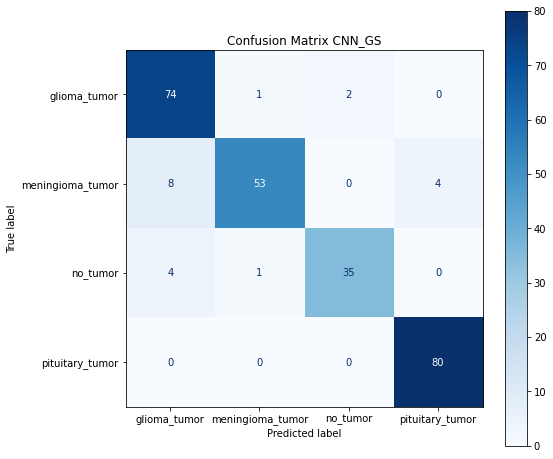

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/CNN/GS/Normal/modelCNN_gs.h", "Blues", "CNN_GS")

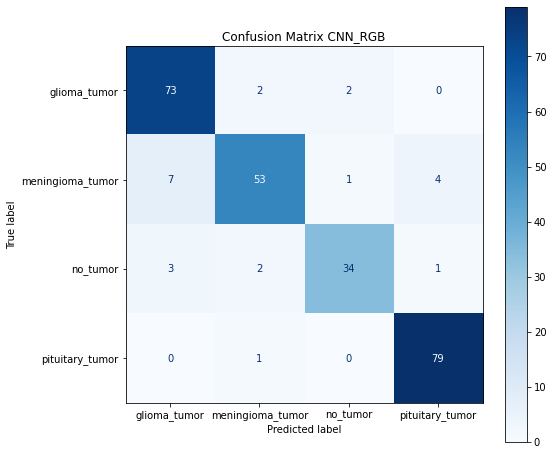

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/CNN/RGB/Normal/modelCNN_rgb.h", "Blues", "CNN_RGB")

###VGG

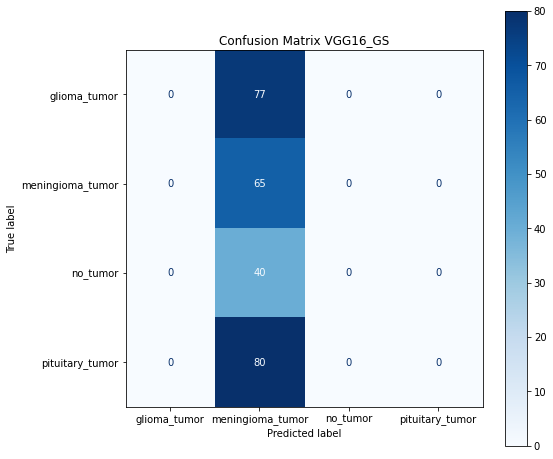

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/VGG16/GS/Normal/modelVGG16_gs.h", "Blues", "VGG16_GS")

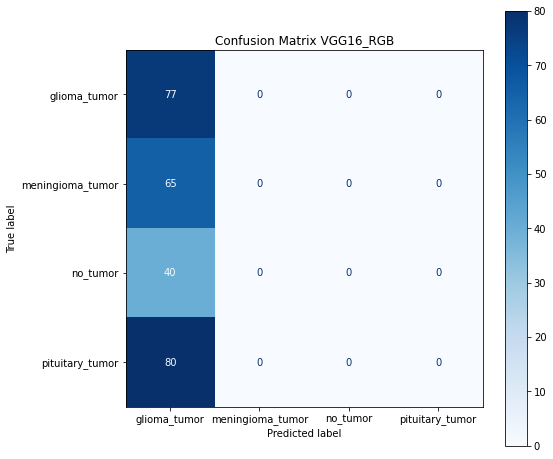

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/VGG16/RGB/Normal/modelVGG16_rgb.h", "Blues", "VGG16_RGB")

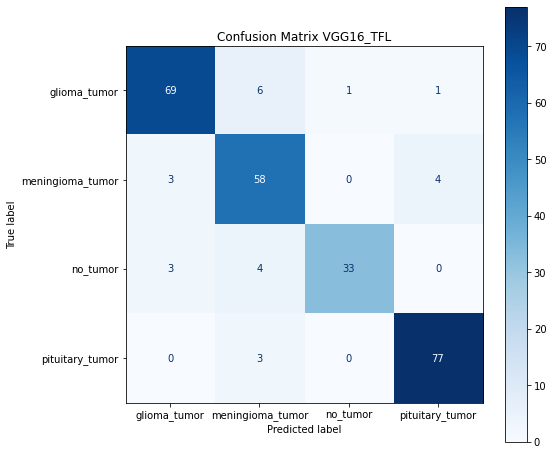

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/VGG16/TFL/Normal/modelVGG16_tfl.h", "Blues", "VGG16_TFL")

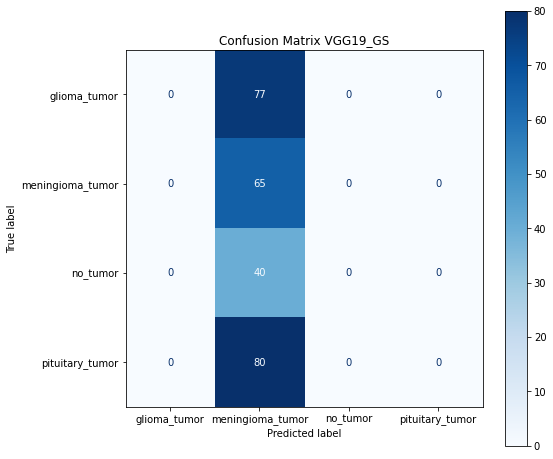

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/VGG19/GS/Normal/modelVGG19_gs.h", "Blues", "VGG19_GS")

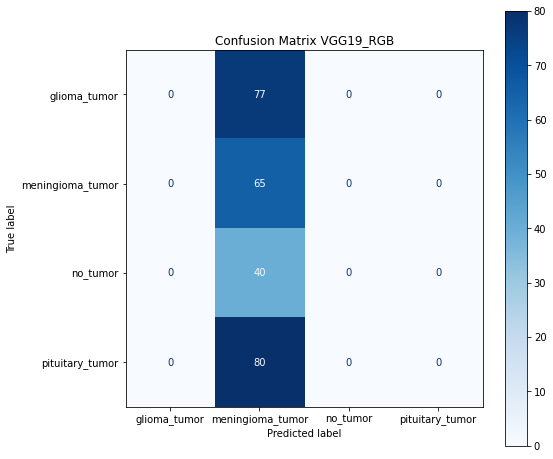

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/VGG19/RGB/Normal/modelVGG19_rgb.h", "Blues", "VGG19_RGB")

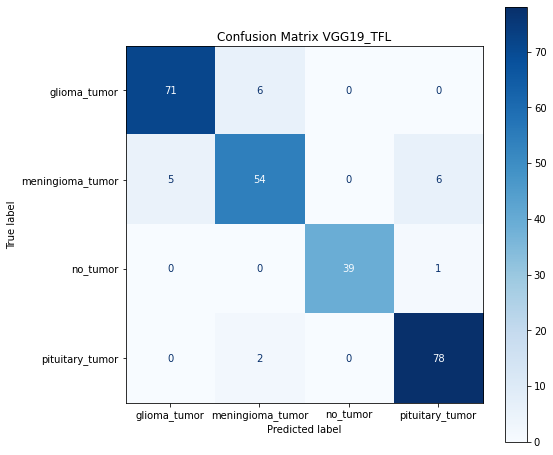

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/VGG19/TFL/Normal/modelVGG19_tfl.h", "Blues", "VGG19_TFL")

###ResNet

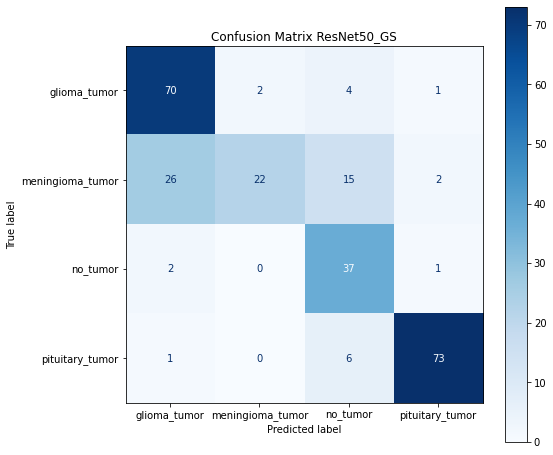

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet50/GS/Normal/modelResnet50_gs.h", "Blues", "ResNet50_GS")

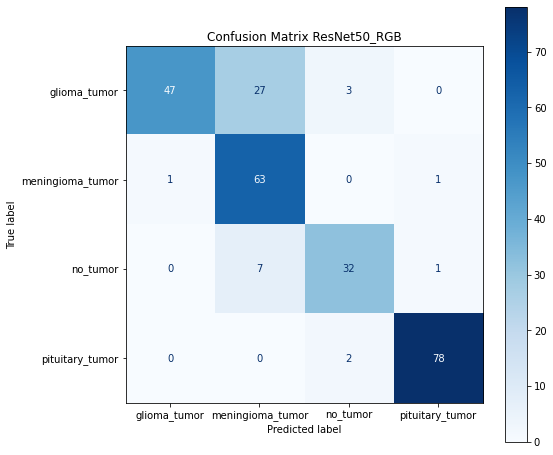

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet50/RGB/Normal/modelResnet50_rgb.h", "Blues", "ResNet50_RGB")

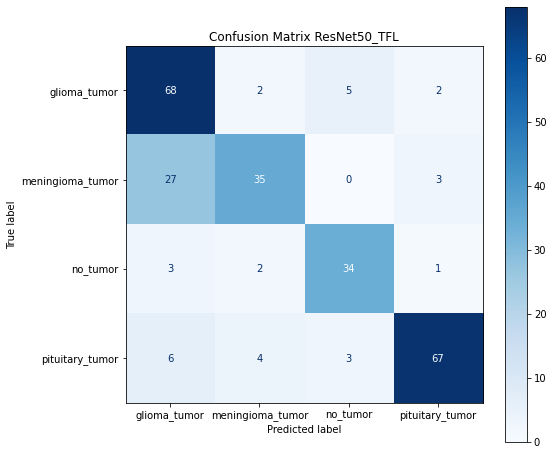

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet50/TFL/Normal/modelResnet50_tfl.h", "Blues", "ResNet50_TFL")

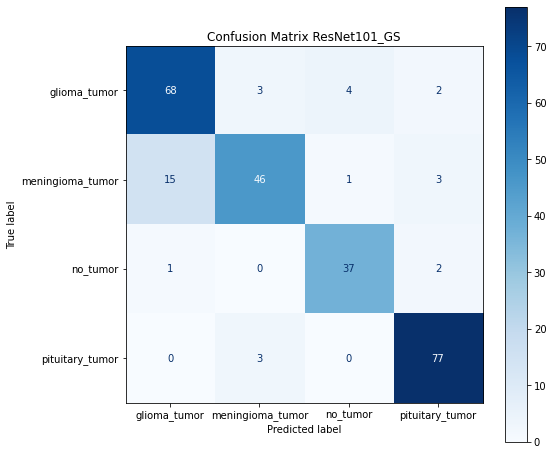

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet101/GS/Normal/modelResnet101_gs.h", "Blues", "ResNet101_GS")

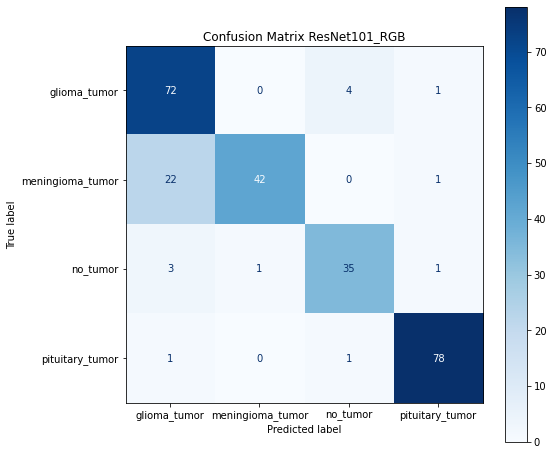

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet101/RGB/Normal/modelResnet101_rgb.h", "Blues", "ResNet101_RGB")

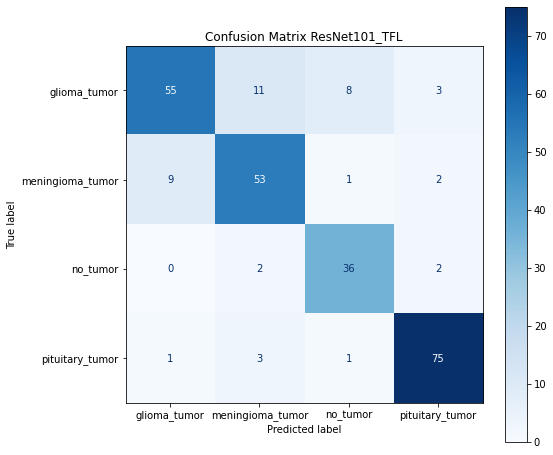

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet101/TFL/Normal/modelResnet101_tfl.h", "Blues", "ResNet101_TFL")

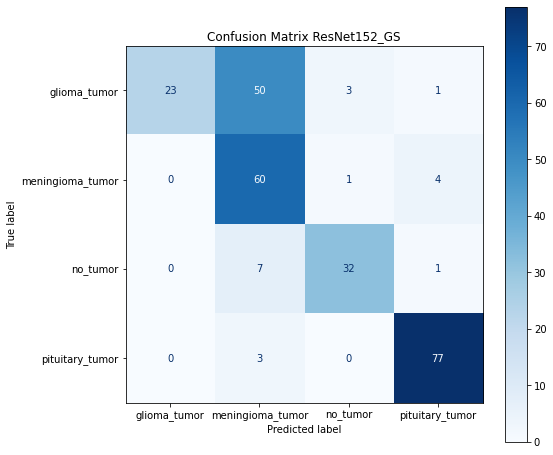

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet152/GS/Normal/modelResnet152_gs.h", "Blues", "ResNet152_GS")

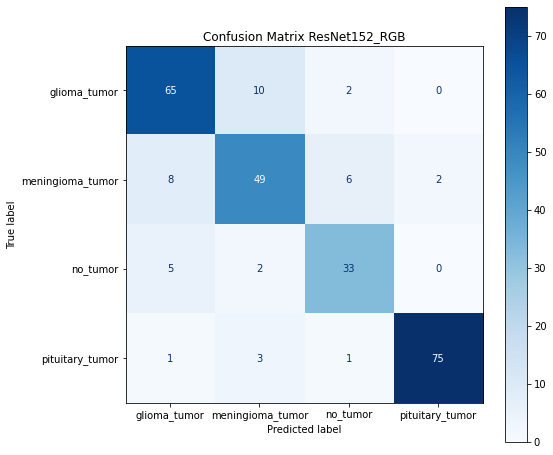

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet152/RGB/Normal/modelResnet152_rgb.h", "Blues", "ResNet152_RGB")

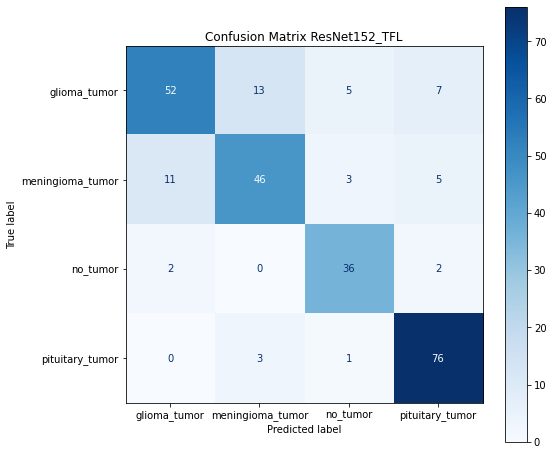

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet152/TFL/Normal/modelResnet152_tfl.h", "Blues", "ResNet152_TFL")

###ResNetV2

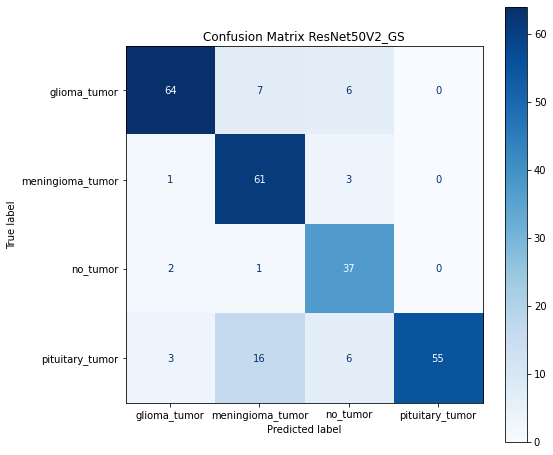

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet50V2/GS/Normal/modelResnet50V2_gs.h", "Blues", "ResNet50V2_GS")

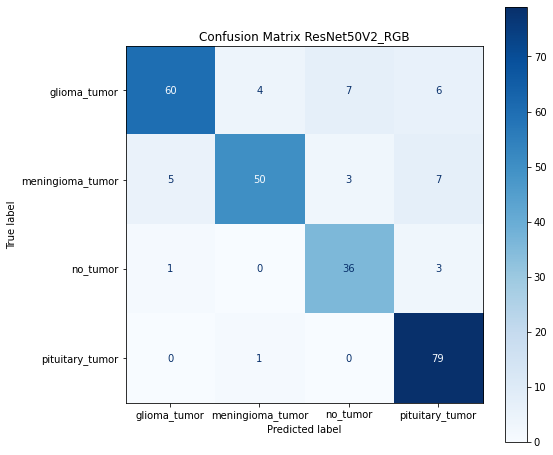

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet50V2/RGB/Normal/modelResnet50V2_rgb.h", "Blues", "ResNet50V2_RGB")

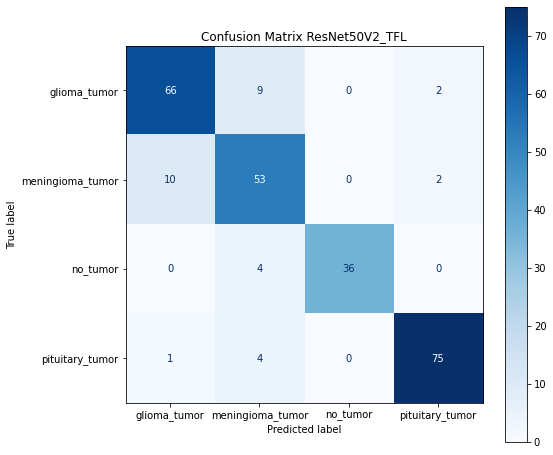

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet50V2/TFL/Normal/modelResnet50V2_tfl.h", "Blues", "ResNet50V2_TFL")

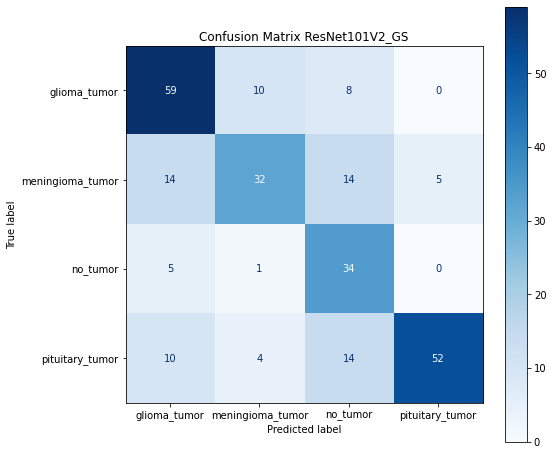

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet101V2/GS/Normal/modelResnet101V2_gs.h", "Blues", "ResNet101V2_GS")

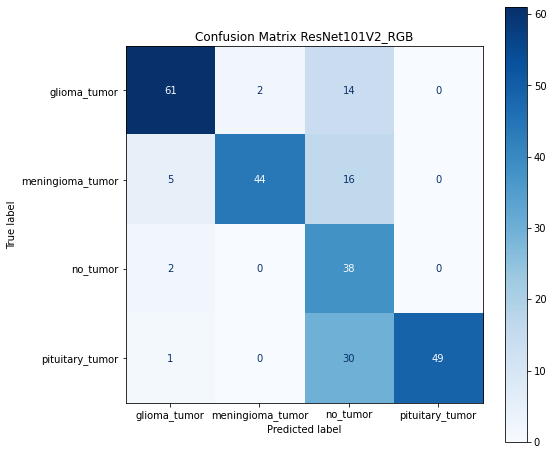

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet101V2/RGB/Normal/modelResnet101V2_rgb.h", "Blues", "ResNet101V2_RGB")

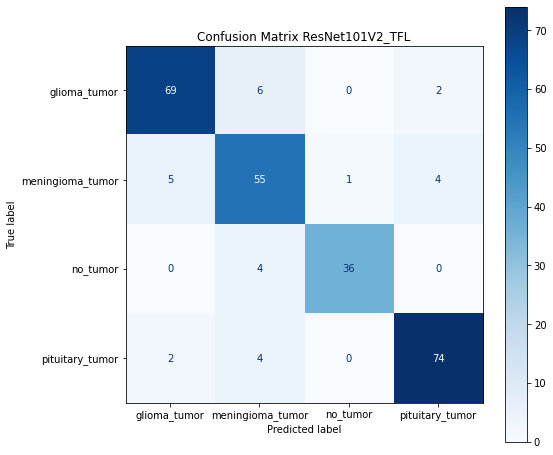

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet101V2/TFL/Normal/modelResnet101V2_tfl.h", "Blues", "ResNet101V2_TFL")

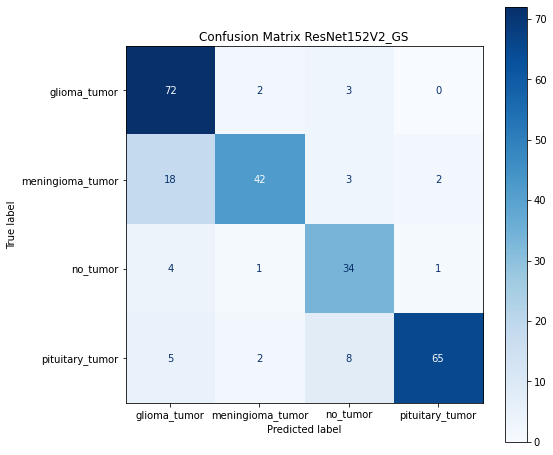

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet152V2/GS/Normal/modelResnet152V2_gs.h", "Blues", "ResNet152V2_GS")

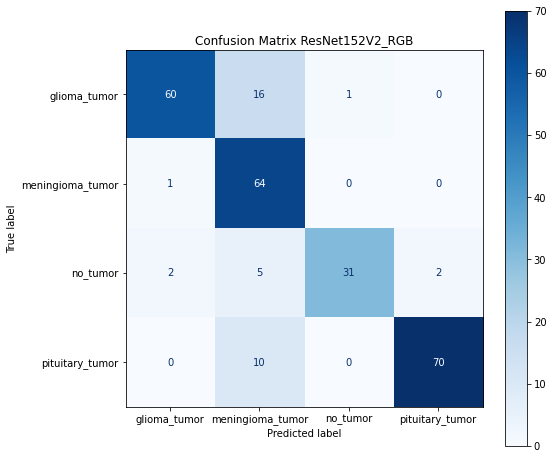

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet152V2/RGB/Normal/modelResnet152V2_rgb.h", "Blues", "ResNet152V2_RGB")

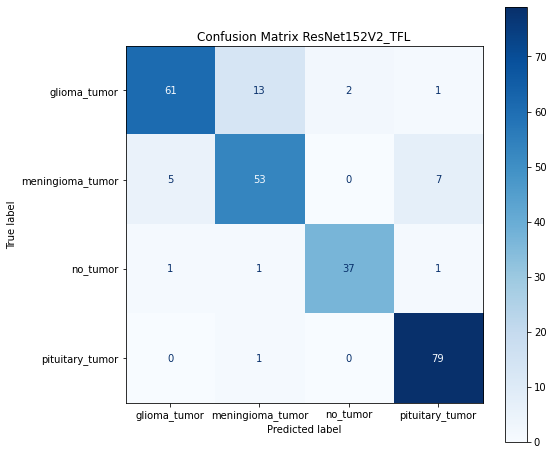

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet152V2/TFL/Normal/modelResnet152V2_tfl.h", "Blues", "ResNet152V2_TFL")

###Xception

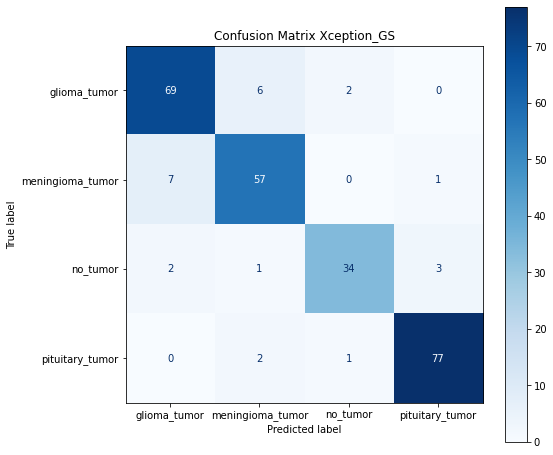

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/Xception/GS/Normal/modelXception_gs.h", "Blues", "Xception_GS")

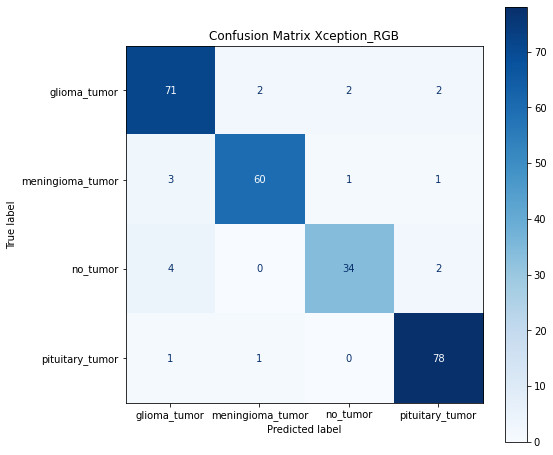

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/Xception/RGB/Normal/modelXception_rgb.h", "Blues", "Xception_RGB")

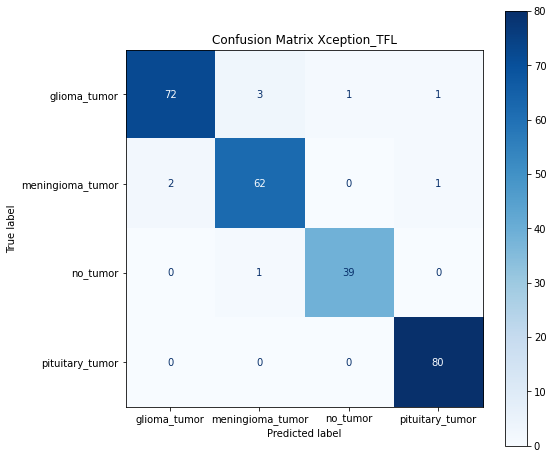

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/Xception/TFL/Normal/modelXception_tfl.h", "Blues", "Xception_TFL")

##Data Augmentation

###Custom

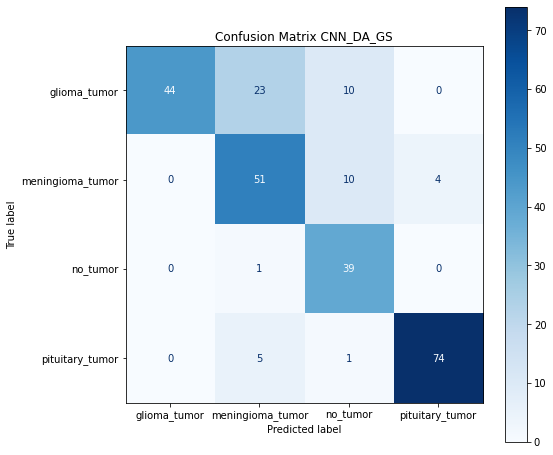

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/CNN/GS/DataAugmentation/modelCNN_gs_da.h", "Blues", "CNN_DA_GS")

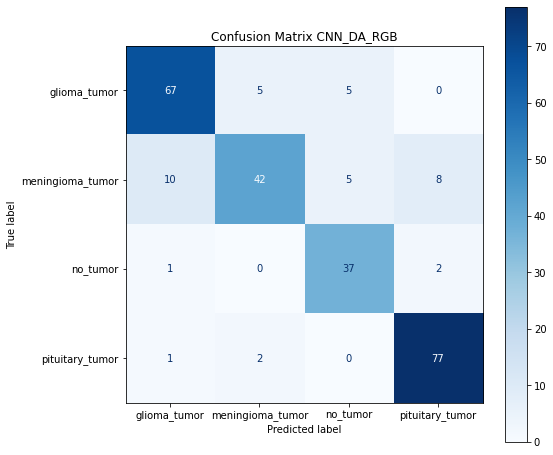

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/CNN/RGB/DataAugmentation/modelCNN_rgb_da.h", "Blues", "CNN_DA_RGB")

###VGG

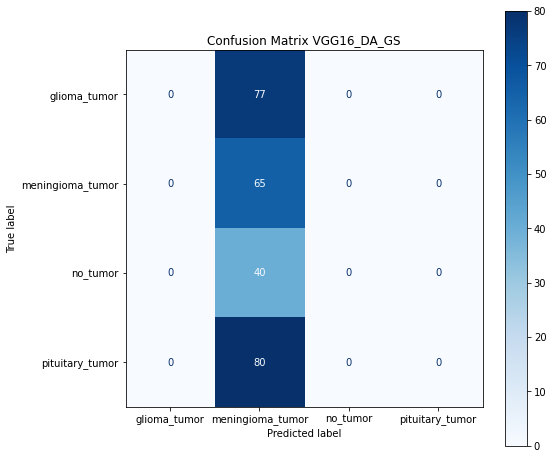

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/VGG16/GS/DataAugmentation/modelVGG16_gs_da.h", "Blues", "VGG16_DA_GS")

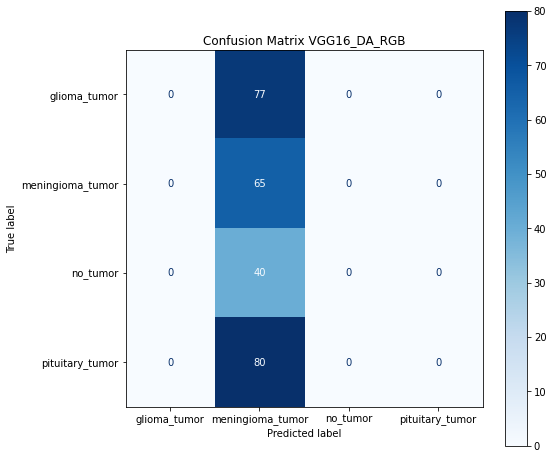

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/VGG16/RGB/DataAugmentation/modelVGG16_rgb_da.h", "Blues", "VGG16_DA_RGB")

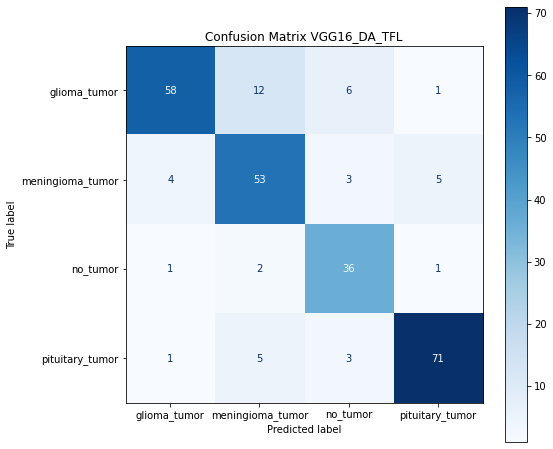

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/VGG16/TFL/DataAugmentation/modelVGG16_tfl_da.h", "Blues", "VGG16_DA_TFL")

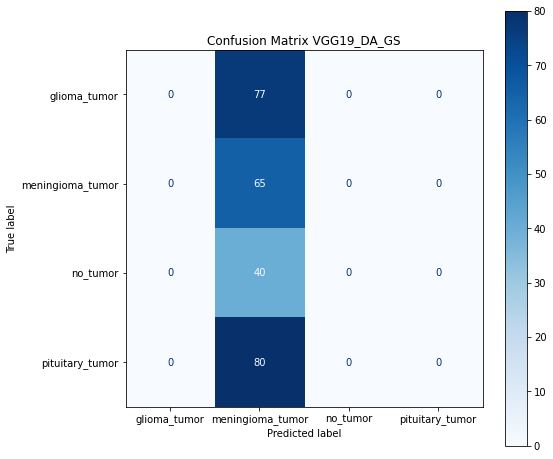

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/VGG19/GS/DataAugmentation/modelVGG19_gs_da.h", "Blues", "VGG19_DA_GS")

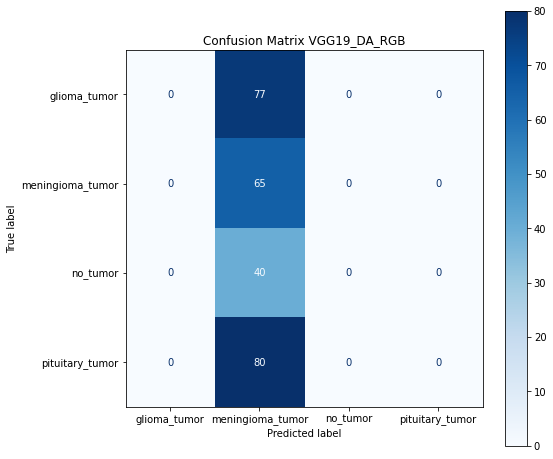

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/VGG19/RGB/DataAugmentation/modelVGG19_rgb_da.h", "Blues", "VGG19_DA_RGB")

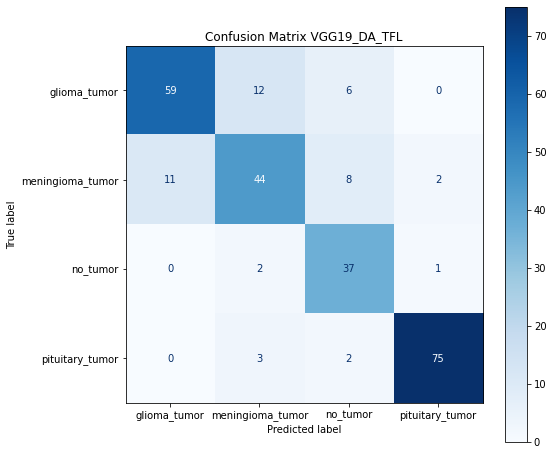

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/VGG19/TFL/DataAugmentation/modelVGG19_tfl_da.h", "Blues", "VGG19_DA_TFL")

###ResNet

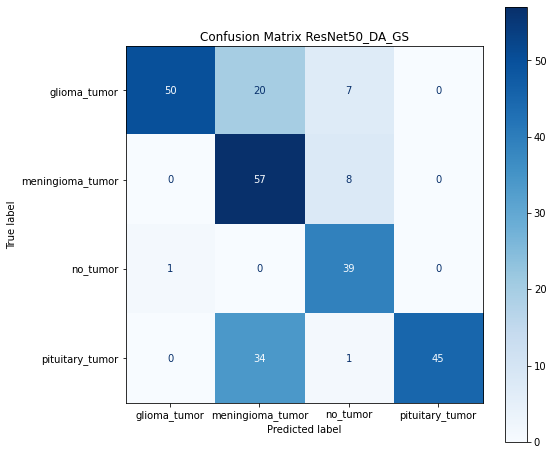

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet50/GS/DataAugmentation/modelResnet50_gs_da.h", "Blues", "ResNet50_DA_GS")

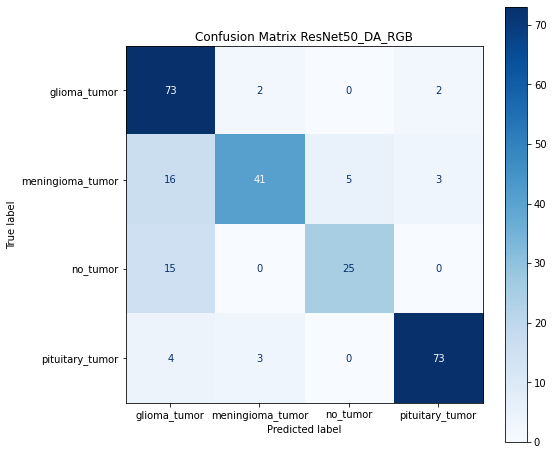

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet50/RGB/DataAugmentation/modelResnet50_rgb_da.h", "Blues", "ResNet50_DA_RGB")

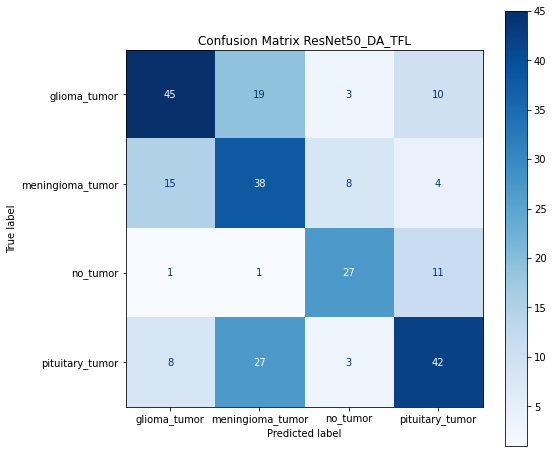

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet50/TFL/DataAugmentation/modelResnet50_tfl_da.h", "Blues", "ResNet50_DA_TFL")

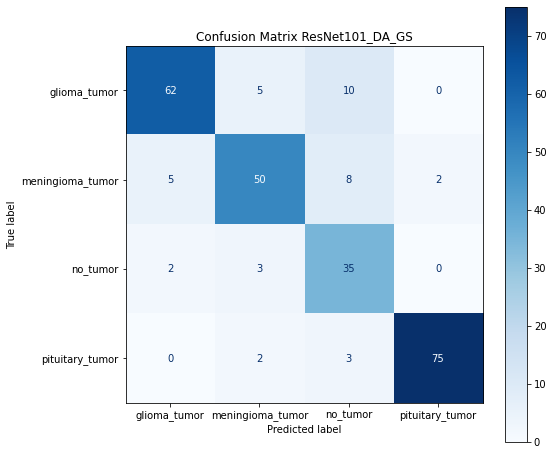

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet101/GS/DataAugmentation/modelResnet101_gs_da.h", "Blues", "ResNet101_DA_GS")

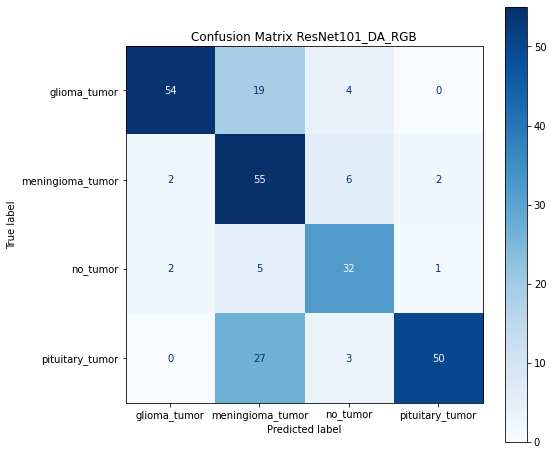

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet101/RGB/DataAugmentation/modelResnet101_rgb_da.h", "Blues", "ResNet101_DA_RGB")

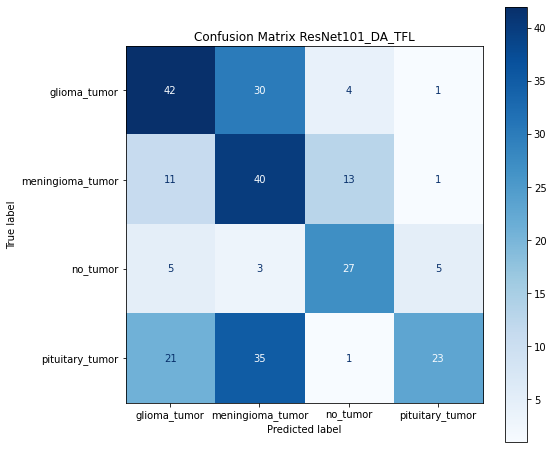

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet101/TFL/DataAugmentation/modelResnet101_tfl_da.h", "Blues", "ResNet101_DA_TFL")

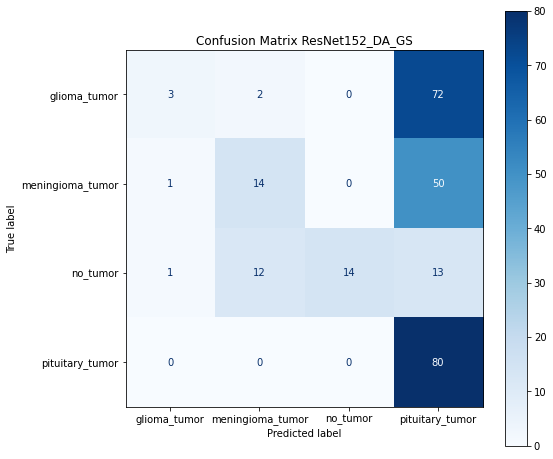

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet152/GS/DataAugmentation/modelResnet152_gs_da.h", "Blues", "ResNet152_DA_GS")

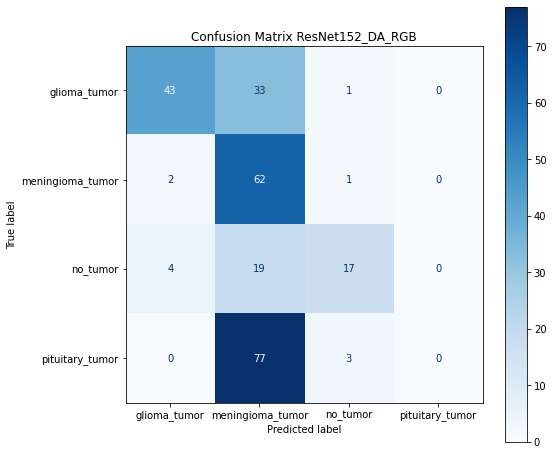

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet152/RGB/DataAugmentation/modelResnet152_rgb_da.h", "Blues", "ResNet152_DA_RGB")

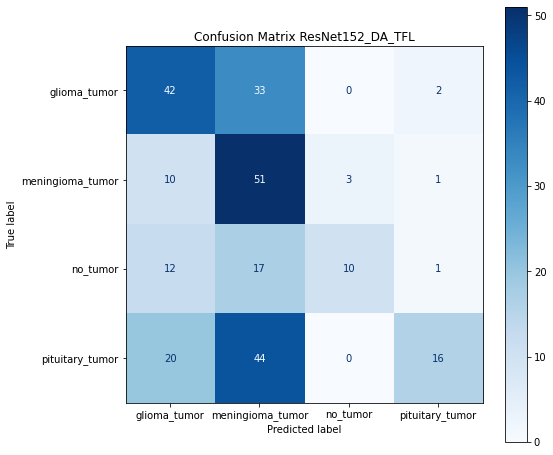

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet152/TFL/DataAugmentation/modelResnet152_tfl_da.h", "Blues", "ResNet152_DA_TFL")

###ResNetV2

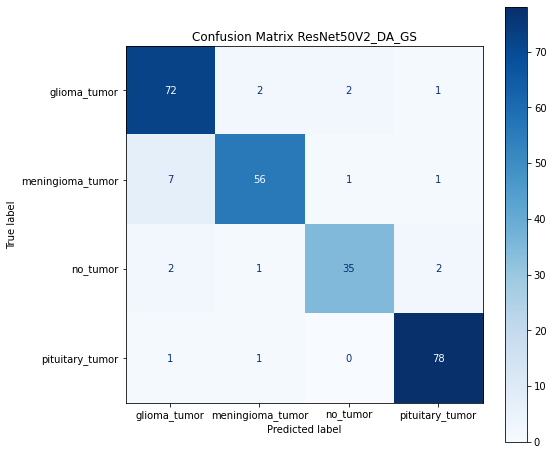

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet50V2/GS/DataAugmentation/modelResnet50V2_gs_da.h", "Blues", "ResNet50V2_DA_GS")

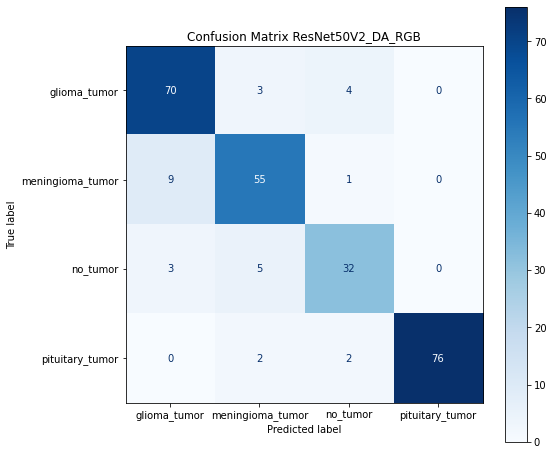

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet50V2/RGB/DataAugmentation/modelResnet50V2_rgb_da.h", "Blues", "ResNet50V2_DA_RGB")

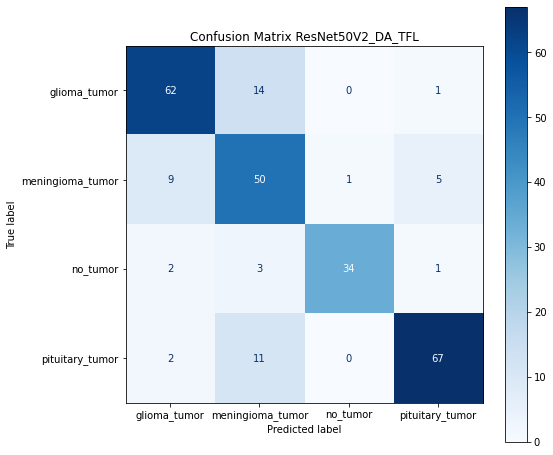

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet50V2/TFL/DataAugmentation/modelResnet50V2_tfl_da.h", "Blues", "ResNet50V2_DA_TFL")

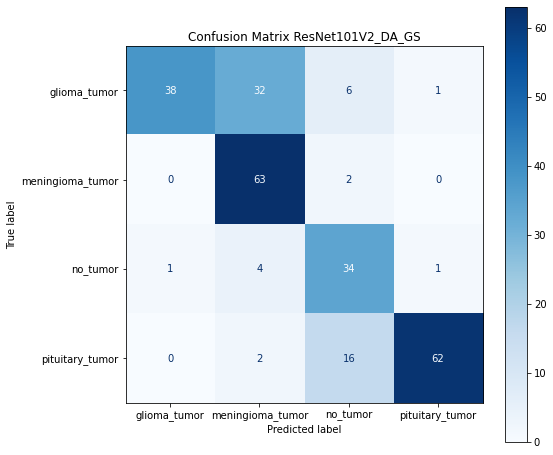

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet101V2/GS/DataAugmentation/modelResnet101V2_gs_da.h", "Blues", "ResNet101V2_DA_GS")

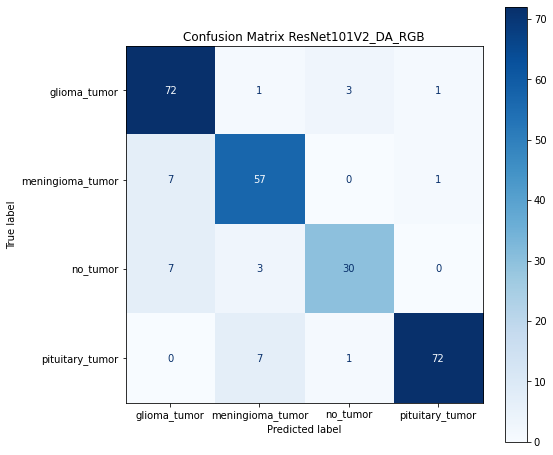

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet101V2/RGB/DataAugmentation/modelResnet101V2_rgb_da.h", "Blues", "ResNet101V2_DA_RGB")

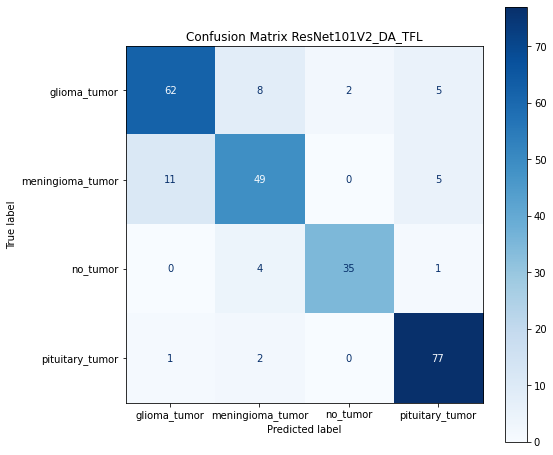

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet101V2/TFL/DataAugmentation/modelResnet101V2_tfl_da.h", "Blues", "ResNet101V2_DA_TFL")

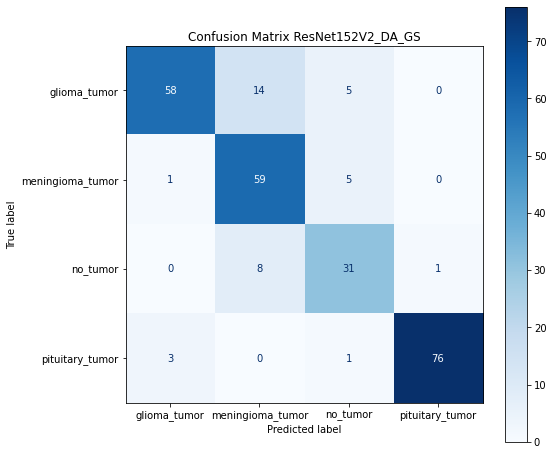

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet152V2/GS/DataAugmentation/modelResnet152V2_gs_da.h", "Blues", "ResNet152V2_DA_GS")

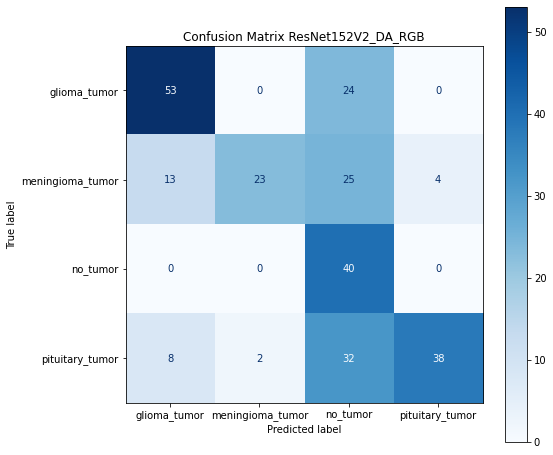

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet152V2/RGB/DataAugmentation/modelResnet152V2_rgb_da.h", "Blues", "ResNet152V2_DA_RGB")

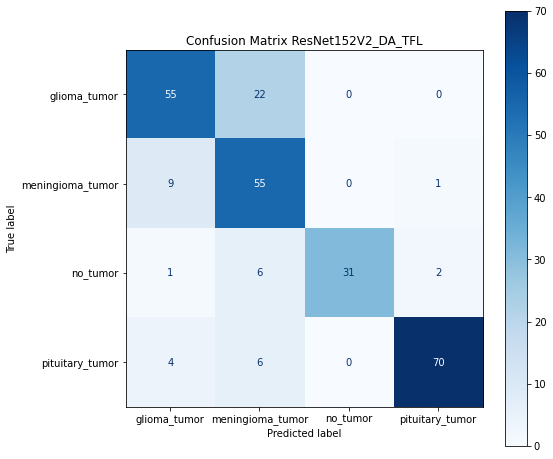

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/ResNet152V2/TFL/DataAugmentation/modelResnet152V2_tfl_da.h", "Blues", "ResNet152V2_DA_TFL")

###Xception

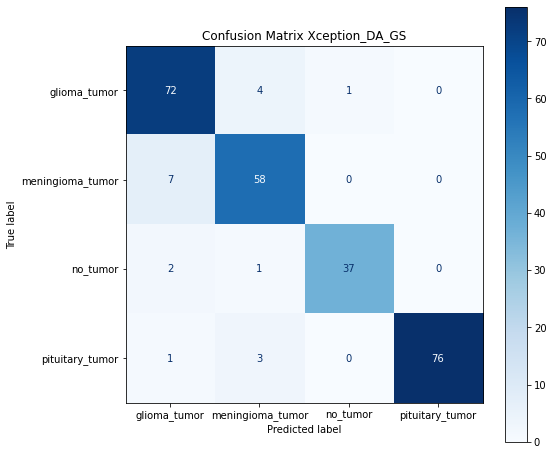

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/Xception/GS/DataAugmentation/modelXception_gs_da.h", "Blues", "Xception_DA_GS")

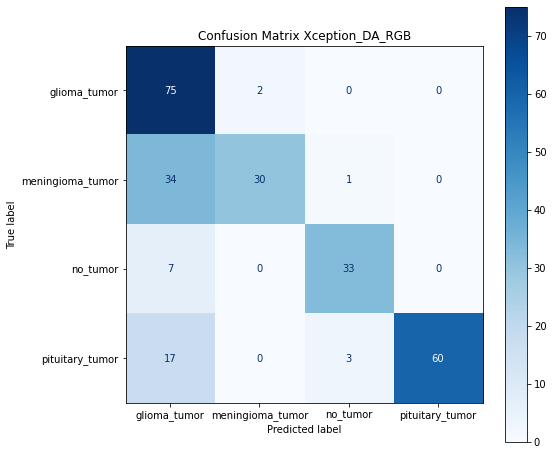

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/Xception/RGB/DataAugmentation/modelXception_rgb_da.h", "Blues", "Xception_DA_RGB")

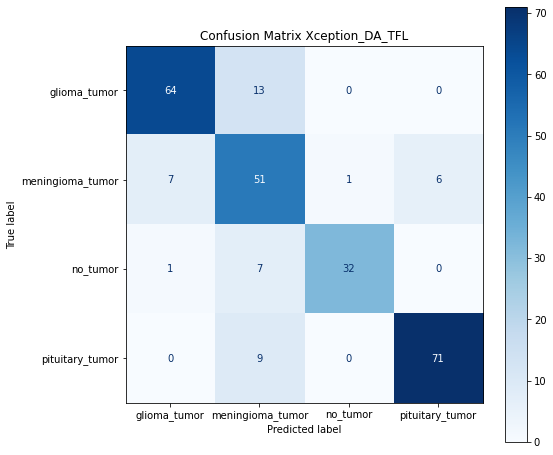

In [ ]:
confusion("/content/drive/MyDrive/tfg/results/Xception/TFL/DataAugmentation/modelXception_tfl_da.h", "Blues", "Xception_DA_TFL")

---
#Manual Segmentation
---

In [ ]:
def crop_segmentation_tumor(img_path, tumor_class):

  img = cv2.imread(img_path)
  grayscale = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  grayscale = cv2.GaussianBlur(grayscale,(5,5), 0)
  threshold_img = cv2.threshold(grayscale, 45, 255, cv2.THRESH_BINARY)[1]
  threshold_img = cv2.erode(threshold_img, None, iterations=12)
  threshold_img = cv2.dilate(threshold_img, None, iterations=10)

  contour = cv2.findContours(threshold_img.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  contour= imutils.grab_contours(contour)
  c = max(contour, key=cv2.contourArea)

  extreme_pnts_left = tuple(c[c[:,:,0].argmin()][0])
  extreme_pnts_right = tuple(c[c[:,:,0].argmax()][0])

  extreme_pnts_top = tuple(c[c[:,:,1].argmin()][0])
  extreme_pnts_bottom = tuple(c[c[:,:,1].argmax()][0])

  new_img = img[extreme_pnts_top[1]:extreme_pnts_bottom[1],extreme_pnts_left[0]:extreme_pnts_right[0]]
  
  plt.figure(figsize=(25,5))
  plt.subplot(1,4,1)
  plt.imshow(img)
  plt.tick_params(axis='both', which='both', 
                  top = False, bottom = False, left = False, right= False,
                  labeltop = False, labelbottom = False, labelleft = False, labelright= False)
  plt.title(f'original {tumor_class}')

  plt.subplot(1,4,2)
  plt.imshow(new_img)
  plt.tick_params(axis='both', which='both', 
                  top = False, bottom = False, left = False, right= False,
                  labeltop = False, labelbottom = False, labelleft = False, labelright= False)
  plt.title(f'cropped {tumor_class}')

  plt.subplot(1,4,3)
  (T, thresh) = cv2.threshold(new_img, 190, 255, cv2.THRESH_BINARY)
  plt.imshow(thresh)
  plt.tick_params(axis='both', which='both', 
                  top = False, bottom = False, left = False, right= False,
                  labeltop = False, labelbottom = False, labelleft = False, labelright= False)
  plt.title(f'cropped segmentation {tumor_class}')

  plt.subplot(1,4,4)
  (T, threshInv) = cv2.threshold(new_img, 190, 255, cv2.THRESH_BINARY_INV)
  plt.imshow(threshInv)
 
  plt.tick_params(axis='both', which='both', 
                  top = False, bottom = False, left = False, right= False,
                  labeltop = False, labelbottom = False, labelleft = False, labelright= False)
  plt.title(f'cropped segmentation inverse {tumor_class}')

  plt.savefig(f"Cropping_{tumor_class}.svg")
  plt.show()

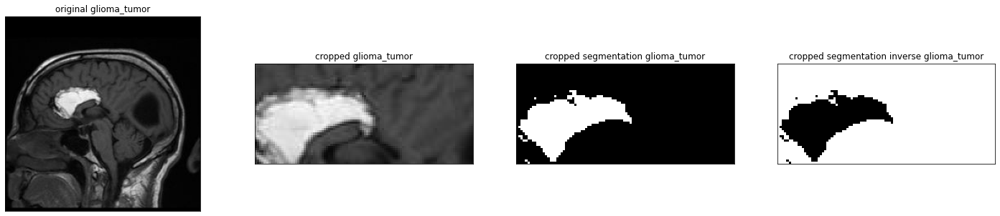

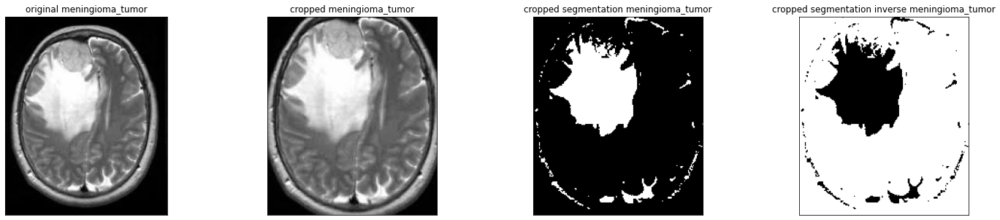

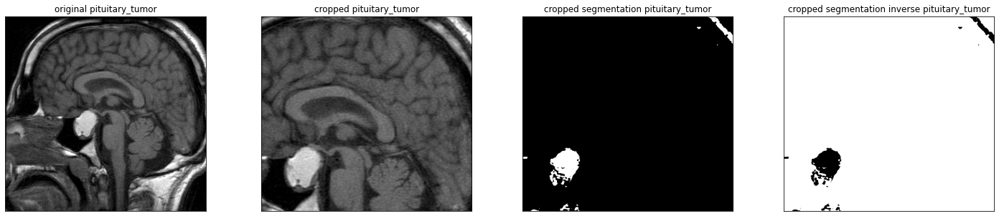

In [ ]:
paths = ['/content/drive/MyDrive/tfg/tumor-classificator/Total/glioma_tumor/image(54).jpg', 
         '/content/drive/MyDrive/tfg/tumor-classificator/Total/meningioma_tumor/image(29).jpg',
         '/content/drive/MyDrive/tfg/tumor-classificator/Total/pituitary_tumor/image(43).jpg']

for index, path in enumerate(paths):
  if index == 2:
    index= index + 1
  crop_segmentation_tumor(path, classes[index])

---
#Loss and Accuracy Graphics 
---

In [ ]:
def plot_Acc_Loss(models):
  for model in models:
    fig, subplots = plt.subplots(1, 2, figsize=(20, 6))
    constants = [('accuracy','val_accuracy', 'Accuracy'), ('loss','val_loss', 'Loss')]

    for index,cons in enumerate(constants):
      subplots[index].plot(model[0][cons[0]], label=cons[0])
      subplots[index].plot(model[0][cons[1]], label=cons[1])
      subplots[index].set_title(f'{model[1]} {cons[2]}')     
                                                   
    fig.text(0.5, 0.04, 'Epochs', ha='center')
    fig.text(0.07, 0.5, 'Values', va='center', rotation='vertical')               
    subplots[0].legend(loc="lower right")                                                
    subplots[1].legend(loc="upper right")     
    fig.savefig(f"Acc_{model[1]}.svg")                                     
    fig.show() 

In [ ]:
# ----------------- Sin aumento de datos ---------------------- 
model_CNN_history_rgb = pickle.load(open( "/content/drive/MyDrive/tfg/results/CNN/RGB/Normal/modelCNN_rgb", "rb" ))
model_CNN_history_gs = pickle.load(open( "/content/drive/MyDrive/tfg/results/CNN/GS/Normal/modelCNN_gs", "rb" ))

model_VGG16_history_rgb = pickle.load(open( "/content/drive/MyDrive/tfg/results/VGG16/RGB/Normal/modelVGG16_rgb", "rb" ))
model_VGG16_history_gs = pickle.load(open( "/content/drive/MyDrive/tfg/results/VGG16/GS/Normal/modelVGG16_gs", "rb" ))
model_VGG16_history_tfl = pickle.load(open( "/content/drive/MyDrive/tfg/results/VGG16/TFL/Normal/modelVGG16_tfl", "rb" ))

model_VGG19_history_rgb = pickle.load(open( "/content/drive/MyDrive/tfg/results/VGG19/RGB/Normal/modelVGG19_rgb", "rb" ))
model_VGG19_history_gs = pickle.load(open( "/content/drive/MyDrive/tfg/results/VGG19/GS/Normal/modelVGG19_gs", "rb" ))
model_VGG19_history_tfl = pickle.load(open( "/content/drive/MyDrive/tfg/results/VGG19/TFL/Normal/modelVGG19_tfl", "rb" ))

model_ResNet50_history_rgb = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet50/RGB/Normal/modelResnet50_rgb", "rb" ))
model_ResNet50_history_gs = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet50/GS/Normal/modelResnet50_gs", "rb" ))
model_ResNet50_history_tfl = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet50/TFL/Normal/modelResnet50_tfl", "rb" ))

model_ResNet101_history_rgb = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet101/RGB/Normal/modelResnet101_rgb", "rb" ))
model_ResNet101_history_gs = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet101/GS/Normal/modelResnet101_gs", "rb" ))
model_ResNet101_history_tfl = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet101/TFL/Normal/modelResnet101_tfl", "rb" ))

model_ResNet152_history_rgb = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet152/RGB/Normal/modelResnet152_rgb", "rb" ))
model_ResNet152_history_gs = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet152/GS/Normal/modelResnet152_gs", "rb" ))
model_ResNet152_history_tfl = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet152/TFL/Normal/modelResnet152_tfl", "rb" ))

model_ResNet50V2_history_rgb = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet50V2/RGB/Normal/modelResnet50V2_rgb", "rb" ))
model_ResNet50V2_history_gs = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet50V2/GS/Normal/modelResnet50V2_gs", "rb" ))
model_ResNet50V2_history_tfl = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet50V2/TFL/Normal/modelResnet50V2_tfl", "rb" ))

model_ResNet101V2_history_rgb = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet101V2/RGB/Normal/modelResnet101V2_rgb", "rb" ))
model_ResNet101V2_history_gs = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet101V2/GS/Normal/modelResnet101V2_gs", "rb" ))
model_ResNet101V2_history_tfl = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet101V2/TFL/Normal/modelResnet101V2_tfl", "rb" ))

model_ResNet152V2_history_rgb = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet152V2/RGB/Normal/modelResnet152V2_rgb", "rb" ))
model_ResNet152V2_history_gs = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet152V2/GS/Normal/modelResnet152V2_gs", "rb" ))
model_ResNet152V2_history_tfl = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet152V2/TFL/Normal/modelResnet152V2_tfl", "rb" ))

model_Xception_history_rgb = pickle.load(open( "/content/drive/MyDrive/tfg/results/Xception/RGB/Normal/modelXception_rgb", "rb" ))
model_Xception_history_gs = pickle.load(open( "/content/drive/MyDrive/tfg/results/Xception/GS/Normal/modelXception_gs", "rb" ))
model_Xception_history_tfl = pickle.load(open( "/content/drive/MyDrive/tfg/results/Xception/TFL/Normal/modelXception_tfl", "rb" ))

# ----------------- Con aumento de datos ---------------------- 
model_CNN_history_rgb_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/CNN/RGB/DataAugmentation/modelCNN_rgb_da", "rb" ))
model_CNN_history_gs_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/CNN/GS/DataAugmentation/modelCNN_gs_da", "rb" ))

model_VGG16_history_rgb_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/VGG16/RGB/DataAugmentation/modelVGG16_rgb_da", "rb" ))
model_VGG16_history_gs_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/VGG16/GS/DataAugmentation/modelVGG16_gs_da", "rb" ))
model_VGG16_history_tfl_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/VGG16/TFL/DataAugmentation/modelVGG16_tfl_da", "rb" ))

model_VGG19_history_rgb_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/VGG19/RGB/DataAugmentation/modelVGG19_rgb_da", "rb" ))
model_VGG19_history_gs_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/VGG19/GS/DataAugmentation/modelVGG19_gs_da", "rb" ))
model_VGG19_history_tfl_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/VGG19/TFL/DataAugmentation/modelVGG19_tfl_da", "rb" ))

model_ResNet50_history_rgb_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet50/RGB/DataAugmentation/modelResnet50_rgb_da", "rb" ))
model_ResNet50_history_gs_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet50/GS/DataAugmentation/modelResnet50_gs_da", "rb" ))
model_ResNet50_history_tfl_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet50/TFL/DataAugmentation/modelResnet50_tfl_da", "rb" ))

model_ResNet101_history_rgb_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet101/RGB/DataAugmentation/modelResnet101_rgb_da", "rb" ))
model_ResNet101_history_gs_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet101/GS/DataAugmentation/modelResnet101_gs_da", "rb" ))
model_ResNet101_history_tfl_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet101/TFL/DataAugmentation/modelResnet101_tfl_da", "rb" ))

model_ResNet152_history_rgb_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet152/RGB/DataAugmentation/modelResnet152_rgb_da", "rb" ))
model_ResNet152_history_gs_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet152/GS/DataAugmentation/modelResnet152_gs_da", "rb" ))
model_ResNet152_history_tfl_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet152/TFL/DataAugmentation/modelResnet152_tfl_da", "rb" ))

model_ResNet50V2_history_rgb_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet50V2/RGB/DataAugmentation/modelResnet50V2_rgb_da", "rb" ))
model_ResNet50V2_history_gs_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet50V2/GS/DataAugmentation/modelResnet50V2_gs_da", "rb" ))
model_ResNet50V2_history_tfl_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet50V2/TFL/DataAugmentation/modelResnet50V2_tfl_da", "rb" ))

model_ResNet101V2_history_rgb_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet101V2/RGB/DataAugmentation/modelResnet101V2_rgb_da", "rb" ))
model_ResNet101V2_history_gs_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet101V2/GS/DataAugmentation/modelResnet101V2_gs_da", "rb" ))
model_ResNet101V2_history_tfl_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet101V2/TFL/DataAugmentation/modelResnet101V2_tfl_da", "rb" ))

model_ResNet152V2_history_rgb_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet152V2/RGB/DataAugmentation/modelResnet152V2_rgb_da", "rb" ))
model_ResNet152V2_history_gs_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet152V2/GS/DataAugmentation/modelResnet152V2_gs_da", "rb" ))
model_ResNet152V2_history_tfl_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/ResNet152V2/TFL/DataAugmentation/modelResnet152V2_tfl_da", "rb" ))

model_Xception_history_rgb_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/Xception/RGB/DataAugmentation/modelXception_rgb_da", "rb" ))
model_Xception_history_gs_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/Xception/GS/DataAugmentation/modelXception_gs_da", "rb" ))
model_Xception_history_tfl_da = pickle.load(open( "/content/drive/MyDrive/tfg/results/Xception/TFL/DataAugmentation/modelXception_tfl_da", "rb" ))

##Normal

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


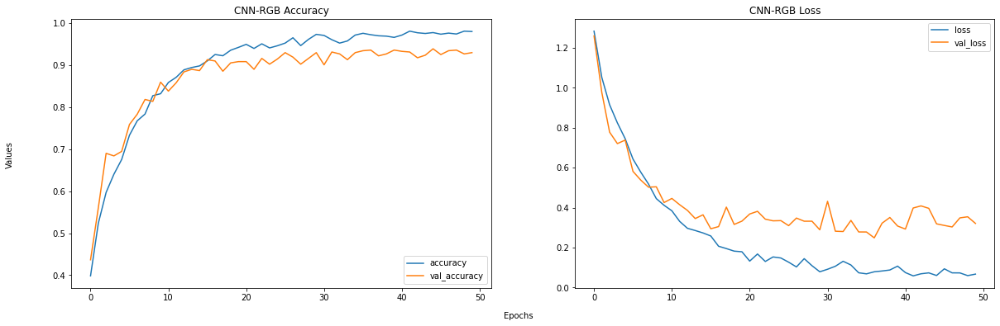

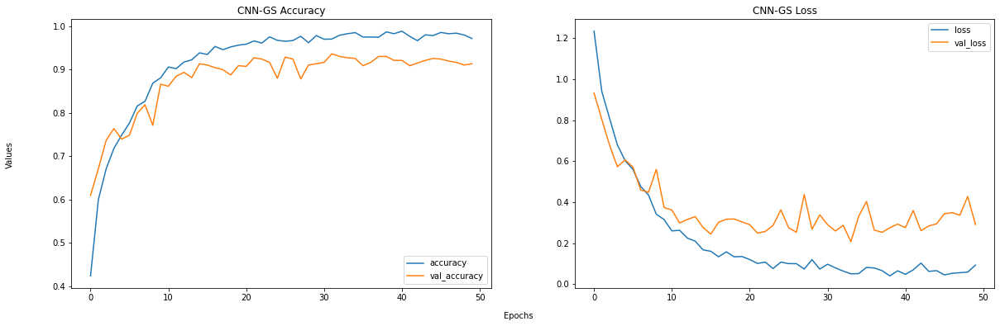

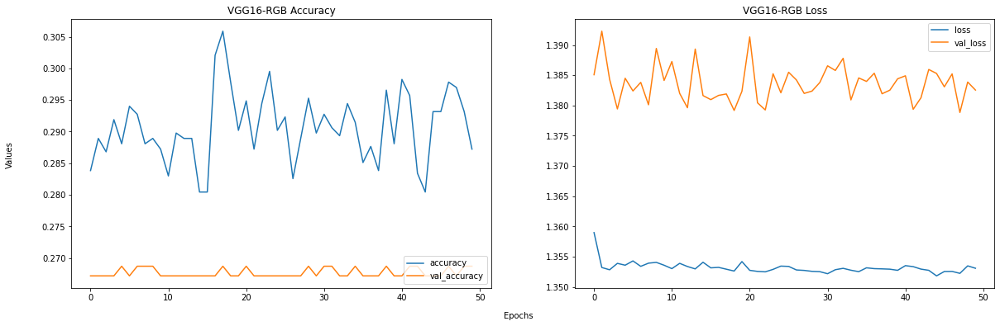

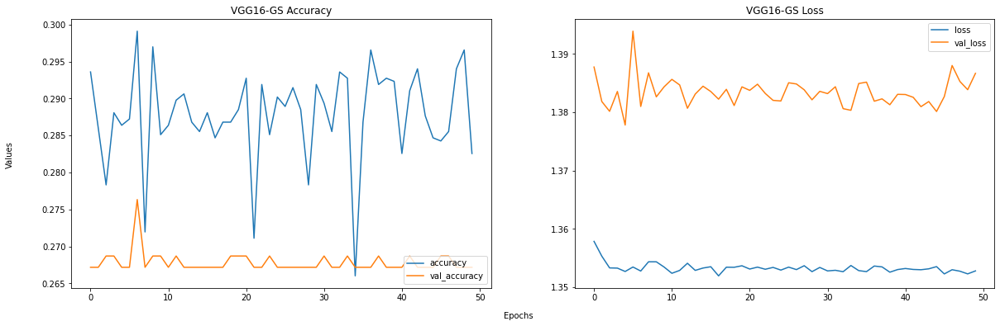

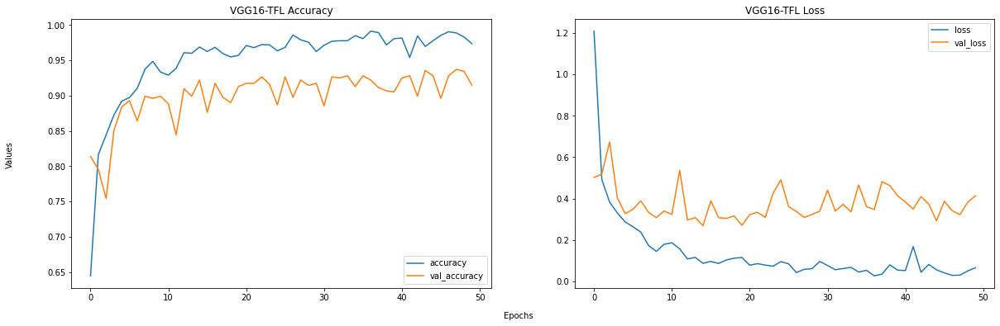

...

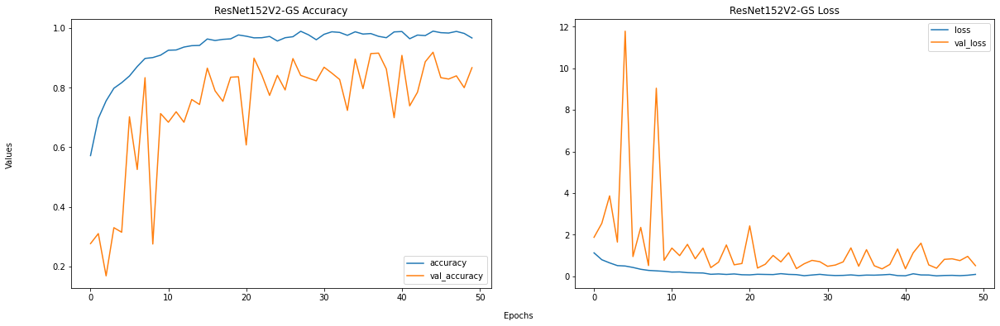

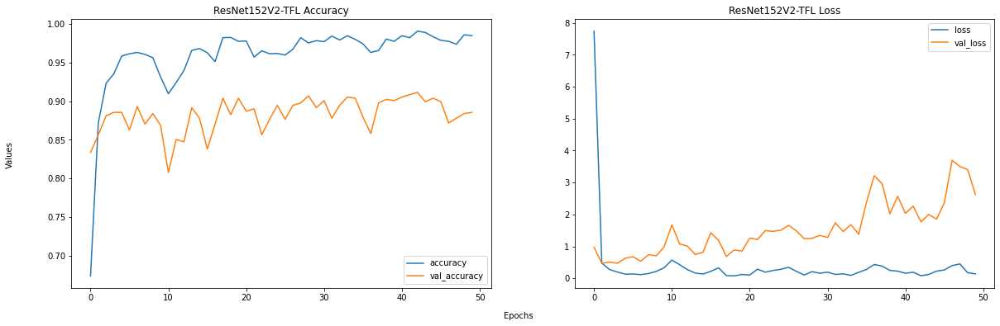

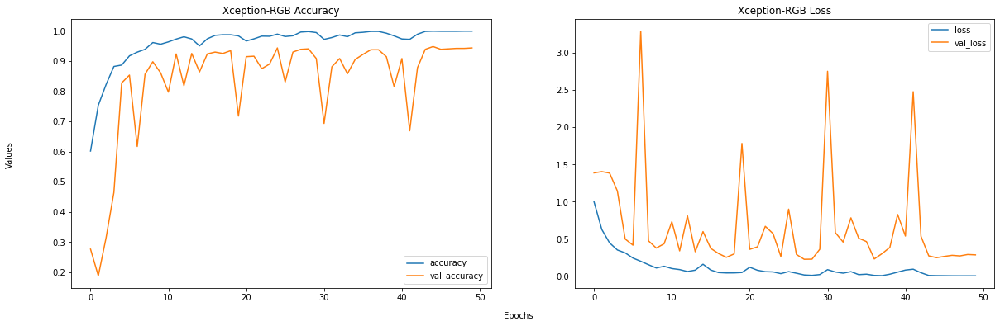

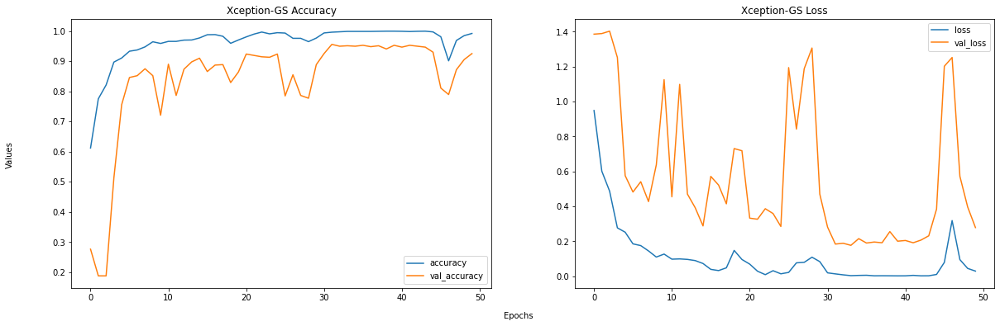

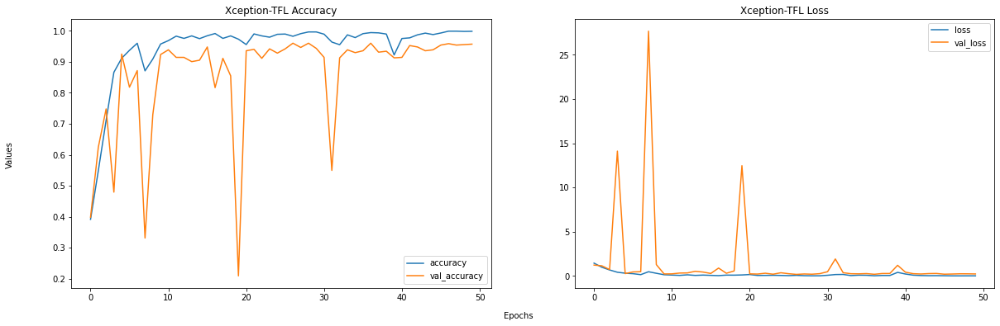

In [ ]:
models = [(model_CNN_history_rgb,"CNN-RGB"),
          (model_CNN_history_gs,"CNN-GS"),
          (model_VGG16_history_rgb, "VGG16-RGB"),
          (model_VGG16_history_gs, "VGG16-GS"),
          (model_VGG16_history_tfl, "VGG16-TFL"),
          (model_VGG19_history_rgb, "VGG19-RGB"),
          (model_VGG19_history_gs, "VGG19-GS"),
          (model_VGG19_history_tfl, "VGG19-TFL"),
          (model_ResNet50_history_rgb, "ResNet50-RGB"),
          (model_ResNet50_history_gs, "ResNet50-GS"),
          (model_ResNet50_history_tfl, "ResNet50-TFL"),
          (model_ResNet101_history_rgb, "ResNet101-RGB"),
          (model_ResNet101_history_gs, "ResNet101-GS"),
          (model_ResNet101_history_tfl, "ResNet101-TFL"),
          (model_ResNet152_history_rgb, "ResNet152-RGB"),
          (model_ResNet152_history_gs, "ResNet152-GS"),
          (model_ResNet152_history_tfl, "ResNet152-TFL"),
          (model_ResNet50V2_history_rgb, "ResNet50V2-RGB"),
          (model_ResNet50V2_history_gs, "ResNet50V2-GS"),
          (model_ResNet50V2_history_tfl, "ResNet50V2-TFL"),
          (model_ResNet101V2_history_rgb, "ResNet101V2-RGB"),
          (model_ResNet101V2_history_gs, "ResNet101V2-GS"),
          (model_ResNet101V2_history_tfl, "ResNet101V2-TFL"),
          (model_ResNet152V2_history_rgb, "ResNet152V2-RGB"),
          (model_ResNet152V2_history_gs, "ResNet152V2-GS"),
          (model_ResNet152V2_history_tfl, "ResNet152V2-TFL"), 
          (model_Xception_history_rgb, "Xception-RGB"),
          (model_Xception_history_gs, "Xception-GS"),
          (model_Xception_history_tfl, "Xception-TFL")]
plot_Acc_Loss(models)

##Data Augmentation

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


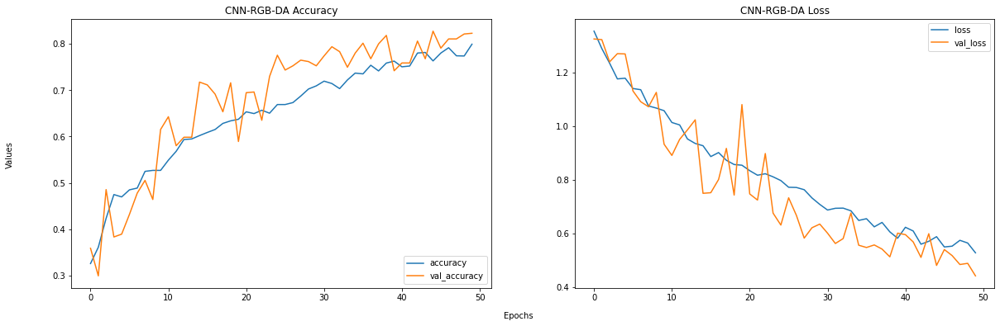

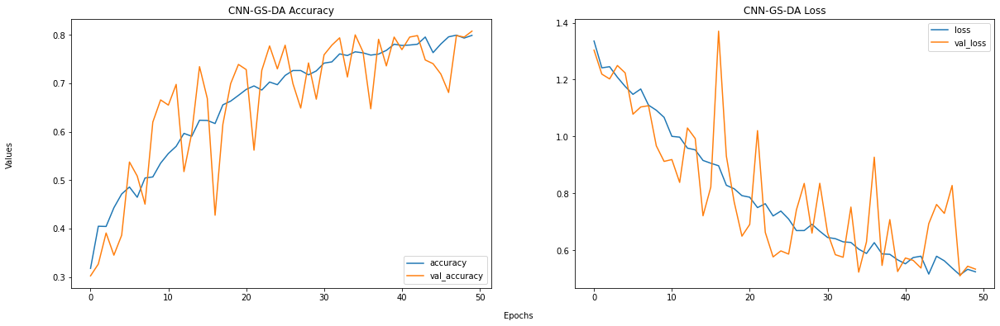

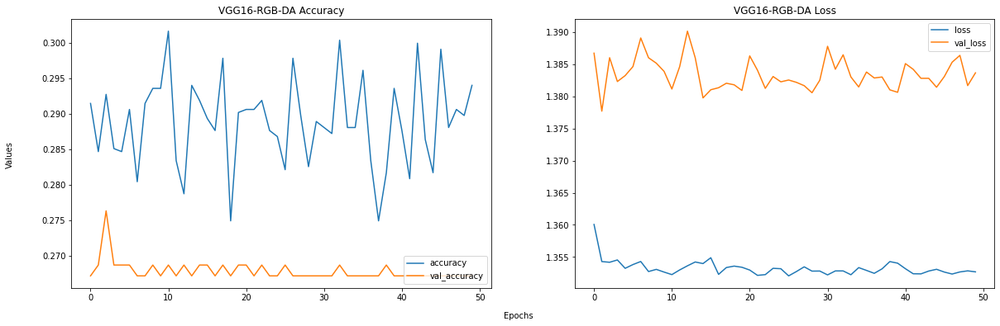

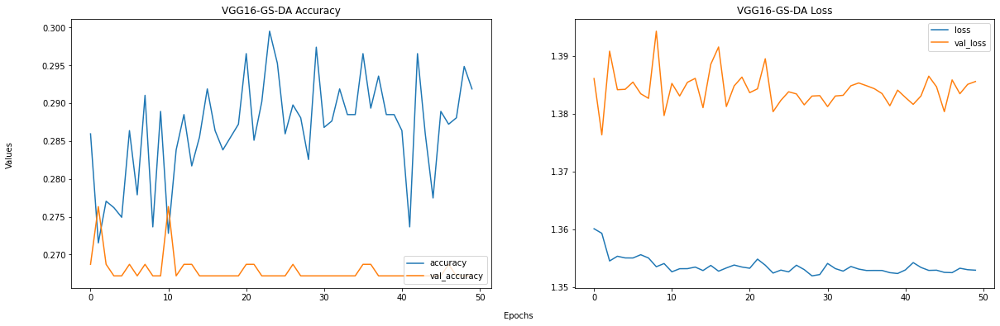

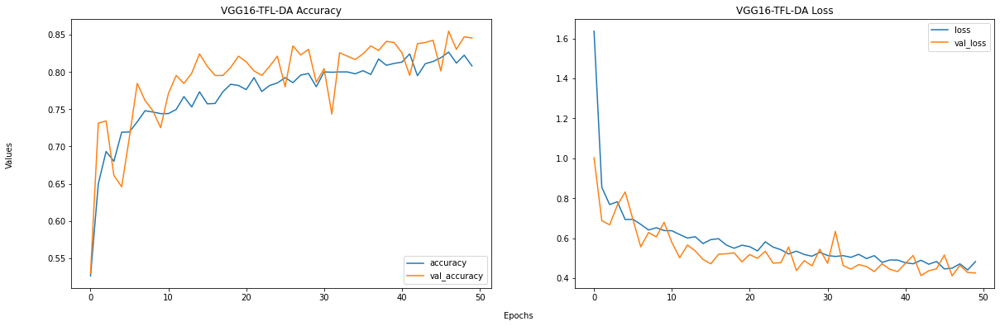

...

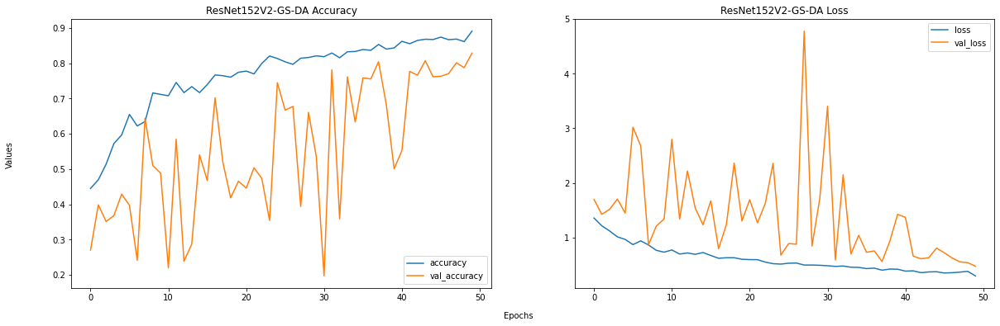

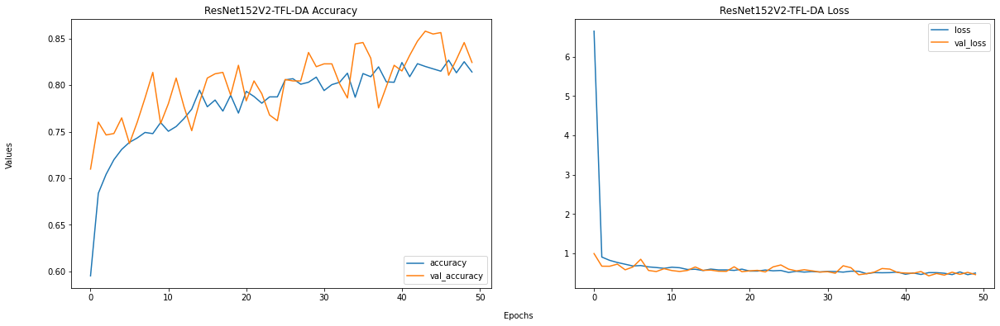

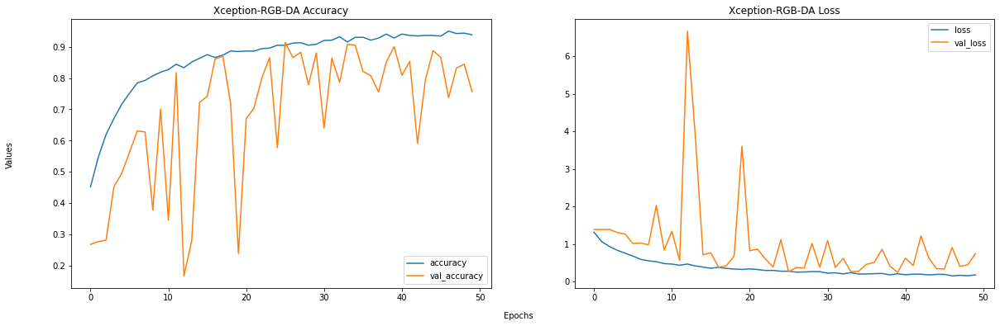

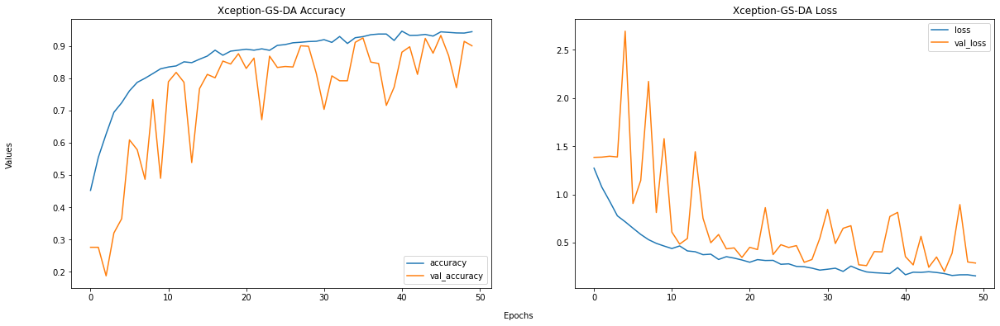

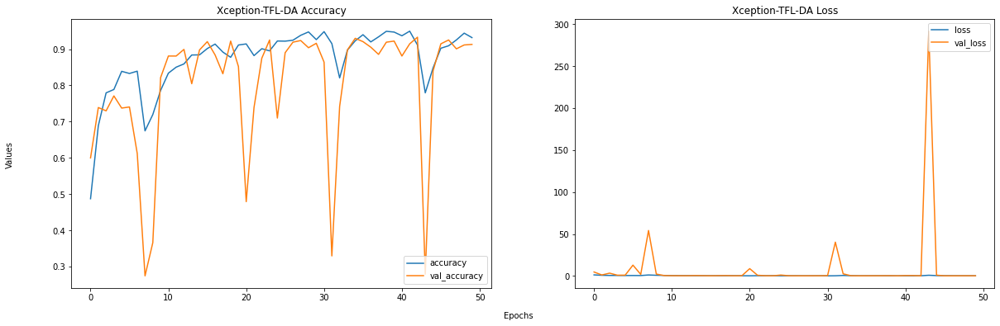

In [ ]:
models = [(model_CNN_history_rgb_da,"CNN-RGB-DA"),
          (model_CNN_history_gs_da,"CNN-GS-DA"),
          (model_VGG16_history_rgb_da, "VGG16-RGB-DA"),
          (model_VGG16_history_gs_da, "VGG16-GS-DA"),
          (model_VGG16_history_tfl_da, "VGG16-TFL-DA"),
          (model_VGG19_history_rgb_da, "VGG19-RGB-DA"),
          (model_VGG19_history_gs_da, "VGG19-GS-DA"),
          (model_VGG19_history_tfl_da, "VGG19-TFL-DA"),
          (model_ResNet50_history_rgb_da, "ResNet50-RGB-DA"),
          (model_ResNet50_history_gs_da, "ResNet50-GS-DA"),
          (model_ResNet50_history_tfl_da, "ResNet50-TFL-DA"),
          (model_ResNet101_history_rgb_da, "ResNet101-RGB-DA"),
          (model_ResNet101_history_gs_da, "ResNet101-GS-DA"),
          (model_ResNet101_history_tfl_da, "ResNet101-TFL-DA"),
          (model_ResNet152_history_rgb_da, "ResNet152-RGB-DA"),
          (model_ResNet152_history_gs_da, "ResNet152-GS-DA"),
          (model_ResNet152_history_tfl_da, "ResNet152-TFL-DA"),
          (model_ResNet50V2_history_rgb_da, "ResNet50V2-RGB-DA"),
          (model_ResNet50V2_history_gs_da, "ResNet50V2-GS-DA"),
          (model_ResNet50V2_history_tfl_da, "ResNet50V2-TFL-DA"),
          (model_ResNet101V2_history_rgb_da, "ResNet101V2-RGB-DA"),
          (model_ResNet101V2_history_gs_da, "ResNet101V2-GS-DA"),
          (model_ResNet101V2_history_tfl_da, "ResNet101V2-TFL-DA"),
          (model_ResNet152V2_history_rgb_da, "ResNet152V2-RGB-DA"),
          (model_ResNet152V2_history_gs_da, "ResNet152V2-GS-DA"),
          (model_ResNet152V2_history_tfl_da, "ResNet152V2-TFL-DA"), 
          (model_Xception_history_rgb_da, "Xception-RGB-DA"),
          (model_Xception_history_gs_da, "Xception-GS-DA"),
          (model_Xception_history_tfl_da, "Xception-TFL-DA")]
plot_Acc_Loss(models)

##Top 5 Models

In [ ]:
def plot_Acc_Top5(models):
  fig, subplots = plt.subplots(2, figsize=(7, 10))
  for i in range(0,2):
    constants = ('accuracy','val_accuracy')
    titles = ('Top 5 Accuracy', 'Top 5 Val_Accurracy')
    subplots[i].set_title(f'{titles[i]}')
    for model in models:
      subplots[i].plot(model[0][constants[i]], label=constants[i]+"_"+model[1])  
    subplots[i].legend(loc="lower right")
    fig.text(0.5, 0.1, 'Epochs', ha='center')
    fig.text(0.07, 0.5, 'Values', va='center', rotation='vertical')   
  fig.savefig("Top5.svg", dpi=25)                               
  fig.show() 

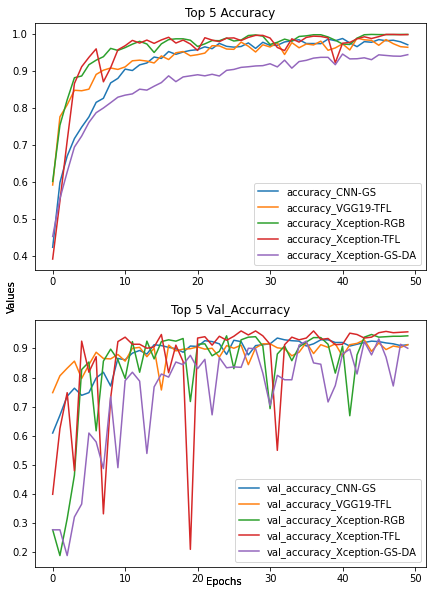

In [ ]:
top_models = [(model_CNN_history_gs, "CNN-GS"),
              (model_VGG19_history_tfl, "VGG19-TFL"),
              (model_Xception_history_rgb, "Xception-RGB"),
              (model_Xception_history_tfl, "Xception-TFL"),
              (model_Xception_history_gs_da, "Xception-GS-DA")]
plot_Acc_Top5(top_models)

---
# Results (f1_weigthed, test_accurac and test_loss) 
---

In [ ]:
def evaluate_model(model, name, X_test, y_test):
  model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999), loss = "categorical_crossentropy", metrics=["accuracy"])
  
  solution_results = model.evaluate(X_test, y_test, verbose = 0)
  y_pred = predicts(model, name)
  Accu = metrics.accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
  f1_score = metrics.f1_score(np.argmax(y_test, axis=1),np.argmax(y_pred, axis=1), average='weighted')
  print(f"model name: {name} \ntest_accuracy: {solution_results[1]} \ntest_loss: {solution_results[0]} \nf1_weighted: {f1_score} \ntest_accuracy by metrics: { Accu }")

##Normal

###Custom

**GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/CNN/GS/Normal/modelCNN_gs.h')
evaluate_model(model, "CNN-GS", X_test_gs, y_test_gs)

model name: CNN-GS 
test_accuracy: 0.9236640930175781 
test_loss: 0.27205169200897217 
f1_weighted: 0.9226839463647166 
test_accuracy by metrics: 0.9236641221374046


**RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/CNN/RGB/Normal/modelCNN_rgb.h')
evaluate_model(model, "CNN-RGB", X_test_rgb, y_test_rgb)

model name: CNN-RGB 
test_accuracy: 0.9122137427330017 
test_loss: 0.35739320516586304 
f1_weighted: 0.9109794130495582 
test_accuracy by metrics: 0.9122137404580153


###VGG

**VGG16 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG16/GS/Normal/modelVGG16_gs.h')
evaluate_model(model, "VGG16-GS", X_test_gs, y_test_gs)

model name: VGG16-GS 
test_accuracy: 0.24809160828590393 
test_loss: 1.3618112802505493 
f1_weighted: 0.09862968928729837 
test_accuracy by metrics: 0.2480916030534351


**VGG16 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG16/RGB/Normal/modelVGG16_rgb.h')
evaluate_model(model, "VGG16-RGB", X_test_rgb, y_test_rgb)

model name: VGG16-RGB 
test_accuracy: 0.29389312863349915 
test_loss: 1.3615968227386475 
f1_weighted: 0.13350897340629153 
test_accuracy by metrics: 0.29389312977099236


**VGG16 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG16/TFL/Normal/modelVGG16_tfl.h')
evaluate_model(model, "VGG16-TFL", X_test_rgb, y_test_rgb)

model name: VGG16-TFL 
test_accuracy: 0.9045801758766174 
test_loss: 0.3362368047237396 
f1_weighted: 0.9048630900731123 
test_accuracy by metrics: 0.9045801526717557


**VGG19 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG19/GS/Normal/modelVGG19_gs.h')
evaluate_model(model, "VGG19-GS", X_test_gs, y_test_gs)

model name: VGG19-GS 
test_accuracy: 0.24809160828590393 
test_loss: 1.3617645502090454 
f1_weighted: 0.09862968928729837 
test_accuracy by metrics: 0.2480916030534351


**VGG19 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG19/RGB/Normal/modelVGG19_rgb.h')
evaluate_model(model, "VGG19-RGB", X_test_rgb, y_test_rgb)

model name: VGG19-RGB 
test_accuracy: 0.24809160828590393 
test_loss: 1.3605365753173828 
f1_weighted: 0.09862968928729837 
test_accuracy by metrics: 0.2480916030534351


**VGG19 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG19/TFL/Normal/modelVGG19_tfl.h')
evaluate_model(model, "VGG19-TFL", X_test_rgb, y_test_rgb)

model name: VGG19-TFL 
test_accuracy: 0.9236640930175781 
test_loss: 0.2873203456401825 
f1_weighted: 0.9231667074855052 
test_accuracy by metrics: 0.9236641221374046


###ResNet

**ResNet50 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50/GS/Normal/modelResnet50_gs.h')
evaluate_model(model, "ResNet50-GS", X_test_gs, y_test_gs)

model name: ResNet50-GS 
test_accuracy: 0.7709923386573792 
test_loss: 1.6422810554504395 
f1_weighted: 0.7511425334443135 
test_accuracy by metrics: 0.7709923664122137


**ResNet50 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50/RGB/Normal/modelResnet50_rgb.h')
evaluate_model(model, "ResNet50-RGB", X_test_rgb, y_test_rgb)

model name: ResNet50-RGB 
test_accuracy: 0.8396946787834167 
test_loss: 1.088125228881836 
f1_weighted: 0.8385736977187359 
test_accuracy by metrics: 0.8396946564885496


**ResNet50 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50/TFL/Normal/modelResnet50_tfl.h')
evaluate_model(model, "ResNet50-TFL", X_test_rgb, y_test_rgb)

model name: ResNet50-TFL 
test_accuracy: 0.7786259651184082 
test_loss: 0.5195457339286804 
f1_weighted: 0.77565677253905 
test_accuracy by metrics: 0.7786259541984732


**ResNet101 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101/GS/Normal/modelResnet101_gs.h')
evaluate_model(model, "ResNet101-GS", X_test_gs, y_test_gs)

model name: ResNet101-GS 
test_accuracy: 0.8702290058135986 
test_loss: 0.5244832038879395 
f1_weighted: 0.8678400823171856 
test_accuracy by metrics: 0.8702290076335878


**ResNet101 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101/RGB/Normal/modelResnet101_rgb.h')
evaluate_model(model, "ResNet101-RGB", X_test_rgb, y_test_rgb)

model name: ResNet101-RGB 
test_accuracy: 0.8664122223854065 
test_loss: 0.7748237252235413 
f1_weighted: 0.864240776739947 
test_accuracy by metrics: 0.8664122137404581


**ResNet101 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101/TFL/Normal/modelResnet101_tfl.h')
evaluate_model(model, "ResNet101-TFL", X_test_rgb, y_test_rgb)

model name: ResNet101-TFL 
test_accuracy: 0.8358778357505798 
test_loss: 0.44770750403404236 
f1_weighted: 0.8344589463313061 
test_accuracy by metrics: 0.8358778625954199


**ResNet152 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152/GS/Normal/modelResnet152_gs.h')
evaluate_model(model, "ResNet152-GS", X_test_gs, y_test_gs)

model name: ResNet152-GS 
test_accuracy: 0.732824444770813 
test_loss: 1.1095671653747559 
f1_weighted: 0.713164865551021 
test_accuracy by metrics: 0.732824427480916


**ResNet152 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152/RGB/Normal/modelResnet152_rgb.h')
evaluate_model(model, "ResNet152-RGB", X_test_rgb, y_test_rgb)

model name: ResNet152-RGB 
test_accuracy: 0.847328245639801 
test_loss: 0.6772512197494507 
f1_weighted: 0.847995246558148 
test_accuracy by metrics: 0.8473282442748091


**ResNet152 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152/TFL/Normal/modelResnet152_tfl.h')
evaluate_model(model, "ResNet152-TFL", X_test_rgb, y_test_rgb)

model name: ResNet152-TFL 
test_accuracy: 0.8015267252922058 
test_loss: 0.5671458840370178 
f1_weighted: 0.7973005537263123 
test_accuracy by metrics: 0.8015267175572519


###ResNetV2

**ResNetV2-50 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50V2/GS/Normal/modelResnet50V2_gs.h')
evaluate_model(model, "ResNet50V2-GS", X_test_gs, y_test_gs)

model name: ResNet50V2-GS 
test_accuracy: 0.8282442688941956 
test_loss: 0.6672626733779907 
f1_weighted: 0.8292877249730882 
test_accuracy by metrics: 0.8282442748091603


**ResNetV2-50 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50V2/RGB/Normal/modelResnet50V2_rgb.h')
evaluate_model(model, "ResNet50V2-RGB", X_test_rgb, y_test_rgb)

model name: ResNet50V2-RGB 
test_accuracy: 0.8587786555290222 
test_loss: 0.8155501484870911 
f1_weighted: 0.856866392380328 
test_accuracy by metrics: 0.8587786259541985


**ResNetV2-50 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50V2/TFL/Normal/modelResnet50V2_tfl.h')
evaluate_model(model, "ResNet50V2-TFL", X_test_rgb, y_test_rgb)

model name: ResNet50V2-TFL 
test_accuracy: 0.8778625726699829 
test_loss: 2.444162607192993 
f1_weighted: 0.8794025648562972 
test_accuracy by metrics: 0.8778625954198473


**ResNetV2-101 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101V2/GS/Normal/modelResnet101V2_gs.h')
evaluate_model(model, "ResNet101V2-GS", X_test_gs, y_test_gs)

model name: ResNet101V2-GS 
test_accuracy: 0.6755725145339966 
test_loss: 1.414045810699463 
f1_weighted: 0.6781172654354801 
test_accuracy by metrics: 0.6755725190839694


**ResNetV2-101 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101V2/RGB/Normal/modelResnet101V2_rgb.h')
evaluate_model(model, "ResNet101V2-RGB", X_test_rgb, y_test_rgb)

model name: ResNet101V2-RGB 
test_accuracy: 0.732824444770813 
test_loss: 1.2855520248413086 
f1_weighted: 0.7583136511093594 
test_accuracy by metrics: 0.732824427480916


**ResNetV2-101 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101V2/TFL/Normal/modelResnet101V2_tfl.h')
evaluate_model(model, "ResNet101V2-TFL", X_test_rgb, y_test_rgb)

model name: ResNet101V2-TFL 
test_accuracy: 0.8931297659873962 
test_loss: 4.18740701675415 
f1_weighted: 0.8939381173663288 
test_accuracy by metrics: 0.8931297709923665


**ResNetV2-152 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152V2/GS/Normal/modelResnet152V2_gs.h')
evaluate_model(model, "ResNet152V2-GS", X_test_gs, y_test_gs)

model name: ResNet152V2-GS 
test_accuracy: 0.8129770755767822 
test_loss: 0.6902554035186768 
f1_weighted: 0.8127074854174091 
test_accuracy by metrics: 0.8129770992366412


**ResNetV2-152 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152V2/RGB/Normal/modelResnet152V2_rgb.h')
evaluate_model(model, "ResNet152V2-RGB", X_test_rgb, y_test_rgb)

model name: ResNet152V2-RGB 
test_accuracy: 0.8587786555290222 
test_loss: 0.7372379899024963 
f1_weighted: 0.8630864693540468 
test_accuracy by metrics: 0.8587786259541985


**ResNetV2-152 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152V2/TFL/Normal/modelResnet152V2_tfl.h')
evaluate_model(model, "ResNet152V2-TFL", X_test_rgb, y_test_rgb)

model name: ResNet152V2-TFL 
test_accuracy: 0.8778625726699829 
test_loss: 3.042468547821045 
f1_weighted: 0.8768972215945862 
test_accuracy by metrics: 0.8778625954198473


###Xception

**GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/Xception/GS/Normal/modelXception_gs.h')
evaluate_model(model, "Xception-GS", X_test_gs, y_test_gs)

model name: Xception-GS 
test_accuracy: 0.9045801758766174 
test_loss: 0.3359416127204895 
f1_weighted: 0.9044509109197357 
test_accuracy by metrics: 0.9045801526717557


**RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/Xception/RGB/Normal/modelXception_rgb.h')
evaluate_model(model, "Xception-RGB", X_test_rgb, y_test_rgb)

model name: Xception-RGB 
test_accuracy: 0.927480936050415 
test_loss: 0.350801944732666 
f1_weighted: 0.9271615881386758 
test_accuracy by metrics: 0.9274809160305344


**TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/Xception/TFL/Normal/modelXception_tfl.h')
evaluate_model(model, "Xception-TFL", X_test_rgb, y_test_rgb)

model name: Xception-TFL 
test_accuracy: 0.9656488299369812 
test_loss: 0.12880635261535645 
f1_weighted: 0.9655325450855846 
test_accuracy by metrics: 0.9656488549618321


##Data Augmentation

###Custom

**GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/CNN/GS/DataAugmentation/modelCNN_gs_da.h')
evaluate_model(model, "CNN-GS-DA", X_test_gs, y_test_gs)

model name: CNN-GS-DA 
test_accuracy: 0.7938931584358215 
test_loss: 0.5568554997444153 
f1_weighted: 0.7933620106557021 
test_accuracy by metrics: 0.7938931297709924


**RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/CNN/RGB/DataAugmentation/modelCNN_rgb_da.h')
evaluate_model(model, "CNN-RGB-DA", X_test_rgb, y_test_rgb)

model name: CNN-RGB-DA 
test_accuracy: 0.8511450290679932 
test_loss: 0.414989173412323 
f1_weighted: 0.8466839926667877 
test_accuracy by metrics: 0.851145038167939


###VGG

**VGG16 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG16/GS/DataAugmentation/modelVGG16_gs_da.h')
evaluate_model(model, "VGG16-GS-DA", X_test_gs, y_test_gs)

model name: VGG16-GS-DA 
test_accuracy: 0.24809160828590393 
test_loss: 1.3627865314483643 
f1_weighted: 0.09862968928729837 
test_accuracy by metrics: 0.2480916030534351


**VGG16 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG16/RGB/DataAugmentation/modelVGG16_rgb_da.h')
evaluate_model(model, "VGG16-RGB-DA", X_test_rgb, y_test_rgb)

model name: VGG16-RGB-DA 
test_accuracy: 0.24809160828590393 
test_loss: 1.3608278036117554 
f1_weighted: 0.09862968928729837 
test_accuracy by metrics: 0.2480916030534351


**VGG16 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG16/TFL/DataAugmentation/modelVGG16_tfl_da.h')
evaluate_model(model, "VGG16-TFL-DA", X_test_rgb, y_test_rgb)

model name: VGG16-TFL-DA 
test_accuracy: 0.8320610523223877 
test_loss: 0.4035155773162842 
f1_weighted: 0.8330744100683362 
test_accuracy by metrics: 0.8320610687022901


**VGG19 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG19/GS/DataAugmentation/modelVGG19_gs_da.h')
evaluate_model(model, "VGG19-GS-DA", X_test_gs, y_test_gs)

model name: VGG19-GS-DA 
test_accuracy: 0.24809160828590393 
test_loss: 1.3616724014282227 
f1_weighted: 0.09862968928729837 
test_accuracy by metrics: 0.2480916030534351


**VGG19 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG19/RGB/DataAugmentation/modelVGG19_rgb_da.h')
evaluate_model(model, "VGG19-RGB-DA", X_test_rgb, y_test_rgb)

model name: VGG19-RGB-DA 
test_accuracy: 0.24809160828590393 
test_loss: 1.3601068258285522 
f1_weighted: 0.09862968928729837 
test_accuracy by metrics: 0.2480916030534351


**VGG19 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG19/TFL/DataAugmentation/modelVGG19_tfl_da.h')
evaluate_model(model, "VGG19-TFL-DA", X_test_rgb, y_test_rgb)

model name: VGG19-TFL-DA 
test_accuracy: 0.8206107020378113 
test_loss: 0.48998767137527466 
f1_weighted: 0.820548371313756 
test_accuracy by metrics: 0.8206106870229007


###ResNet

**ResNet50 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50/GS/DataAugmentation/modelResnet50_gs_da.h')
evaluate_model(model, "ResNet50-GS-DA", X_test_gs, y_test_gs)

model name: ResNet50-GS-DA 
test_accuracy: 0.7290076613426208 
test_loss: 0.7028253674507141 
f1_weighted: 0.7354985801161473 
test_accuracy by metrics: 0.7290076335877863


**ResNet50 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50/RGB/DataAugmentation/modelResnet50_rgb_da.h')
evaluate_model(model, "ResNet50-RGB-DA", X_test_rgb, y_test_rgb)

model name: ResNet50-RGB-DA 
test_accuracy: 0.8091602921485901 
test_loss: 0.5119990706443787 
f1_weighted: 0.8064162778241434 
test_accuracy by metrics: 0.8091603053435115


**ResNet50 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50/TFL/DataAugmentation/modelResnet50_tfl_da.h')
evaluate_model(model, "ResNet50-TFL-DA", X_test_rgb, y_test_rgb)

model name: ResNet50-TFL-DA 
test_accuracy: 0.580152690410614 
test_loss: 1.0770059823989868 
f1_weighted: 0.5831299203776461 
test_accuracy by metrics: 0.5801526717557252


**ResNet101 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101/GS/DataAugmentation/modelResnet101_gs_da.h')
evaluate_model(model, "ResNet101-GS-DA", X_test_gs, y_test_gs)

model name: ResNet101-GS-DA 
test_accuracy: 0.847328245639801 
test_loss: 0.47490552067756653 
f1_weighted: 0.8511337708387311 
test_accuracy by metrics: 0.8473282442748091


**ResNet101 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101/RGB/DataAugmentation/modelResnet101_rgb_da.h')
evaluate_model(model, "ResNet101-RGB-DA", X_test_rgb, y_test_rgb)

model name: ResNet101-RGB-DA 
test_accuracy: 0.7290076613426208 
test_loss: 1.9198575019836426 
f1_weighted: 0.7392400324265236 
test_accuracy by metrics: 0.7290076335877863


**ResNet101 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101/TFL/DataAugmentation/modelResnet101_tfl_da.h')
evaluate_model(model, "ResNet101-TFL-DA", X_test_rgb, y_test_rgb)

model name: ResNet101-TFL-DA 
test_accuracy: 0.5038167834281921 
test_loss: 1.053667426109314 
f1_weighted: 0.4976551606495204 
test_accuracy by metrics: 0.5038167938931297


**ResNet152 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152/GS/DataAugmentation/modelResnet152_gs_da.h')
evaluate_model(model, "ResNet152-GS-DA", X_test_gs, y_test_gs)

model name: ResNet152-GS-DA 
test_accuracy: 0.4236641228199005 
test_loss: 32.5823860168457 
f1_weighted: 0.3409717941366298 
test_accuracy by metrics: 0.42366412213740456


**ResNet152 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152/RGB/DataAugmentation/modelResnet152_rgb_da.h')
evaluate_model(model, "ResNet152-RGB-DA", X_test_rgb, y_test_rgb)

model name: ResNet152-RGB-DA 
test_accuracy: 0.4656488597393036 
test_loss: 2.5519113540649414 
f1_weighted: 0.40448631460505075 
test_accuracy by metrics: 0.46564885496183206


**ResNet152 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152/TFL/DataAugmentation/modelResnet152_tfl_da.h')
evaluate_model(model, "ResNet152-TFL-DA", X_test_rgb, y_test_rgb)

model name: ResNet152-TFL-DA 
test_accuracy: 0.4541984796524048 
test_loss: 1.0969645977020264 
f1_weighted: 0.4291590886929327 
test_accuracy by metrics: 0.4541984732824427


###ResNetV2

**ResNetV2-50 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50V2/GS/DataAugmentation/modelResnet50V2_gs_da.h')
evaluate_model(model, "ResNet50V2-GS-DA", X_test_gs, y_test_gs)

model name: ResNet50V2-GS-DA 
test_accuracy: 0.919847309589386 
test_loss: 0.40167003870010376 
f1_weighted: 0.9195050457674683 
test_accuracy by metrics: 0.9198473282442748


**ResNetV2-50 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50V2/RGB/DataAugmentation/modelResnet50V2_rgb_da.h')
evaluate_model(model, "ResNet50V2-RGB-DA", X_test_rgb, y_test_rgb)

model name: ResNet50V2-RGB-DA 
test_accuracy: 0.8893129825592041 
test_loss: 0.47516900300979614 
f1_weighted: 0.8898951273977939 
test_accuracy by metrics: 0.8893129770992366


**ResNetV2-50 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50V2/TFL/DataAugmentation/modelResnet50V2_tfl_da.h')
evaluate_model(model, "ResNet50V2-TFL-DA", X_test_rgb, y_test_rgb)

model name: ResNet50V2-TFL-DA 
test_accuracy: 0.8129770755767822 
test_loss: 0.4490918517112732 
f1_weighted: 0.8173564549820076 
test_accuracy by metrics: 0.8129770992366412


**ResNetV2-101 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101V2/GS/DataAugmentation/modelResnet101V2_gs_da.h')
evaluate_model(model, "ResNet101V2-GS-DA", X_test_gs, y_test_gs)

model name: ResNet101V2-GS-DA 
test_accuracy: 0.7519084215164185 
test_loss: 1.1750527620315552 
f1_weighted: 0.7497313595013914 
test_accuracy by metrics: 0.7519083969465649


**ResNetV2-101 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101V2/RGB/DataAugmentation/modelResnet101V2_rgb_da.h')
evaluate_model(model, "ResNet101V2-RGB-DA", X_test_rgb, y_test_rgb)

model name: ResNet101V2-RGB-DA 
test_accuracy: 0.8816794157028198 
test_loss: 0.7779698967933655 
f1_weighted: 0.8815895146153189 
test_accuracy by metrics: 0.8816793893129771


**ResNetV2-101 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101V2/TFL/DataAugmentation/modelResnet101V2_tfl_da.h')
evaluate_model(model, "ResNet101V2-TFL-DA", X_test_rgb, y_test_rgb)

model name: ResNet101V2-TFL-DA 
test_accuracy: 0.8511450290679932 
test_loss: 0.4092915654182434 
f1_weighted: 0.8499785602154196 
test_accuracy by metrics: 0.851145038167939


**ResNetV2-152 - GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152V2/GS/DataAugmentation/modelResnet152V2_gs_da.h')
evaluate_model(model, "ResNet152V2-GS-DA", X_test_gs, y_test_gs)

model name: ResNet152V2-GS-DA 
test_accuracy: 0.8549618124961853 
test_loss: 0.46440476179122925 
f1_weighted: 0.8568296607613943 
test_accuracy by metrics: 0.8549618320610687


**ResNetV2-152 - RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152V2/RGB/DataAugmentation/modelResnet152V2_rgb_da.h')
evaluate_model(model, "ResNet152V2-RGB-DA", X_test_rgb, y_test_rgb)

model name: ResNet152V2-RGB-DA 
test_accuracy: 0.5877862572669983 
test_loss: 1.10675048828125 
f1_weighted: 0.5991871920838112 
test_accuracy by metrics: 0.5877862595419847


**ResNetV2-152 - TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152V2/TFL/DataAugmentation/modelResnet152V2_tfl_da.h')
evaluate_model(model, "ResNet152V2-TFL-DA", X_test_rgb, y_test_rgb)

model name: ResNet152V2-TFL-DA 
test_accuracy: 0.805343508720398 
test_loss: 0.46890386939048767 
f1_weighted: 0.8113529080251225 
test_accuracy by metrics: 0.8053435114503816


###Xception

**GS**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/Xception/GS/DataAugmentation/modelXception_gs_da.h')
evaluate_model(model, "Xception-GS-DA", X_test_gs, y_test_gs)

model name: Xception-GS-DA 
test_accuracy: 0.927480936050415 
test_loss: 0.1502414345741272 
f1_weighted: 0.9282081559634985 
test_accuracy by metrics: 0.9274809160305344


**RGB**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/Xception/RGB/DataAugmentation/modelXception_rgb_da.h')
evaluate_model(model, "Xception-RGB-DA", X_test_rgb, y_test_rgb)

model name: Xception-RGB-DA 
test_accuracy: 0.7557252049446106 
test_loss: 0.6459485292434692 
f1_weighted: 0.7559669023822639 
test_accuracy by metrics: 0.7557251908396947


**TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/Xception/TFL/DataAugmentation/modelXception_tfl_da.h')
evaluate_model(model, "Xception-TFL-DA", X_test_rgb, y_test_rgb)

model name: Xception-TFL-DA 
test_accuracy: 0.8320610523223877 
test_loss: 0.4111216068267822 
f1_weighted: 0.8370113358264121 
test_accuracy by metrics: 0.8320610687022901


---
# Another Results (ROC, f1 and recall)
---

In [ ]:
def model_report(name, model, labels_set, image_set):
  report = classification_report(np.argmax(labels_set, axis=1), np.argmax(predicts(model, name), axis=1))

  # Print the report and plot the UAC/ROC Curve. 
  print(report)
  plot_generic_ROC(model, name, image_set, labels_set)

In [ ]:
def plot_generic_ROC(model, name, image_set, labels_set, color1='darkorange', color2='navy'):
  y_score = model.predict(image_set)

  fpr = dict()
  tpr = dict()
  roc_auc = dict()
  for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(labels_set[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

  # Compute micro-average ROC curve and ROC area
  fpr["micro"], tpr["micro"], _ = roc_curve(labels_set.ravel(), y_score.ravel())
  roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

  plt.figure(figsize=(25,5))
  plt.subplot(1,2,1)
  lw = 2 # line_width
  plt.plot(fpr[3], tpr[3], color=color1,
          lw=lw, label='ROC curve (area = %0.1f)' % roc_auc[3]) # Drawing Curve according to 3. class 
  plt.plot([0, 1], [0, 1], color=color2, lw=lw, linestyle='--')
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('ROC UAC - Model ' + f'{name}')
  plt.legend(loc="lower right")

  plot_ROC_by_classes(roc_auc, fpr, tpr)

In [ ]:
def plot_ROC_by_classes(roc_auc, fpr, tpr):
  # Process of plotting roc-auc curve belonging to all classes.

  # First aggregate all false positive rates
  all_fpr = np.unique(np.concatenate([fpr[i] for i in range(len(classes))]))

  # Then interpolate all ROC curves at this points
  mean_tpr = np.zeros_like(all_fpr)
  for i in range(len(classes)):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

  # Finally average it and compute AUC
  mean_tpr /= len(classes)

  fpr["macro"] = all_fpr
  tpr["macro"] = mean_tpr
  roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

  # Plot all ROC curves
  
  plt.subplot(1,2,2)
  plt.plot(fpr["micro"], tpr["micro"],
          label='micro-average ROC curve (area = {0:0.1f})'
                ''.format(roc_auc["micro"]),
          color='deeppink', linestyle=':', linewidth=4)

  plt.plot(fpr["macro"], tpr["macro"],
          label='macro-average ROC curve (area = {0:0.1f})'
                ''.format(roc_auc["macro"]),
          color='navy', linestyle=':', linewidth=4)

  colors = ['aqua', 'darkorange', 'cornflowerblue', 'green']
  for i, color in zip(range(len(classes)), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,marker='o',
             label='ROC curve of class {0} (area = {1:0.1f})'
             ''.format(i, roc_auc[i]))

  plt.plot([0, 1], [0, 1], 'k--', lw=2)
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('Extending ROC Curve to Multi-Class')
  plt.legend(loc="lower right")
  plt.show()

##Normal

###Custom

**GS**

              precision    recall  f1-score   support

           0       0.86      0.96      0.91        77
           1       0.96      0.82      0.88        65
           2       0.95      0.88      0.91        40
           3       0.95      1.00      0.98        80

    accuracy                           0.92       262
   macro avg       0.93      0.91      0.92       262
weighted avg       0.93      0.92      0.92       262



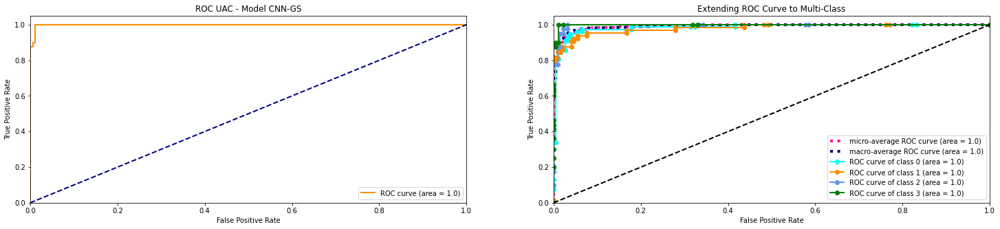

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/CNN/GS/Normal/modelCNN_gs.h')
model_report("CNN-GS", model, y_test_gs, X_test_gs)

**RGB**

              precision    recall  f1-score   support

           0       0.88      0.95      0.91        77
           1       0.91      0.82      0.86        65
           2       0.92      0.85      0.88        40
           3       0.94      0.99      0.96        80

    accuracy                           0.91       262
   macro avg       0.91      0.90      0.91       262
weighted avg       0.91      0.91      0.91       262



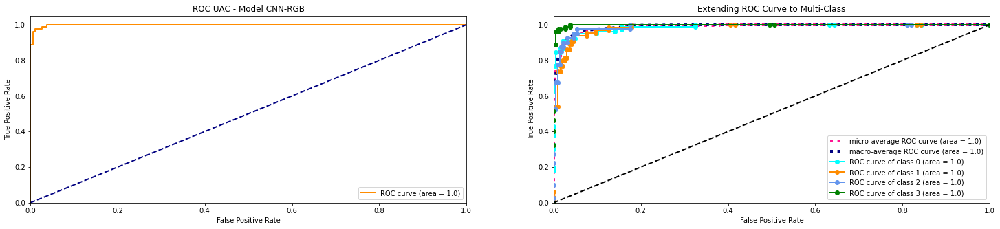

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/CNN/RGB/Normal/modelCNN_rgb.h')
model_report("CNN-RGB", model, y_test_rgb, X_test_rgb)

###VGG

**VGG16 - GS**

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        77
           1       0.25      1.00      0.40        65
           2       0.00      0.00      0.00        40
           3       0.00      0.00      0.00        80

    accuracy                           0.25       262
   macro avg       0.06      0.25      0.10       262
weighted avg       0.06      0.25      0.10       262



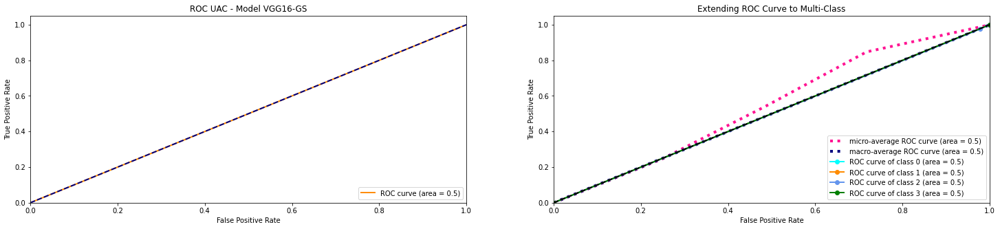

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG16/GS/Normal/modelVGG16_gs.h')
model_report("VGG16-GS", model, y_test_gs, X_test_gs)

**VGG16 - RGB**

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.29      1.00      0.45        77
           1       0.00      0.00      0.00        65
           2       0.00      0.00      0.00        40
           3       0.00      0.00      0.00        80

    accuracy                           0.29       262
   macro avg       0.07      0.25      0.11       262
weighted avg       0.09      0.29      0.13       262



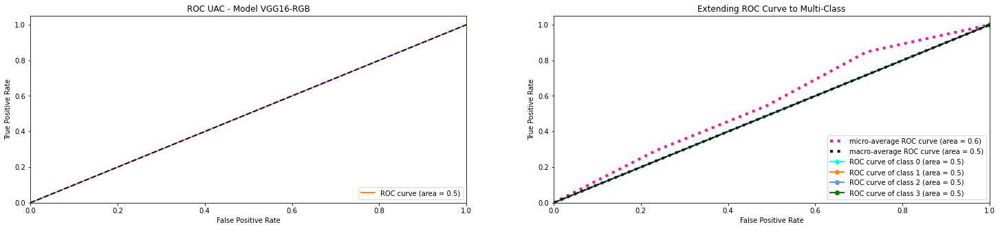

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG16/RGB/Normal/modelVGG16_rgb.h')
model_report("VGG16-RGB", model, y_test_rgb, X_test_rgb)

**VGG16 - TFL**

              precision    recall  f1-score   support

           0       0.92      0.90      0.91        77
           1       0.82      0.89      0.85        65
           2       0.97      0.82      0.89        40
           3       0.94      0.96      0.95        80

    accuracy                           0.90       262
   macro avg       0.91      0.89      0.90       262
weighted avg       0.91      0.90      0.90       262



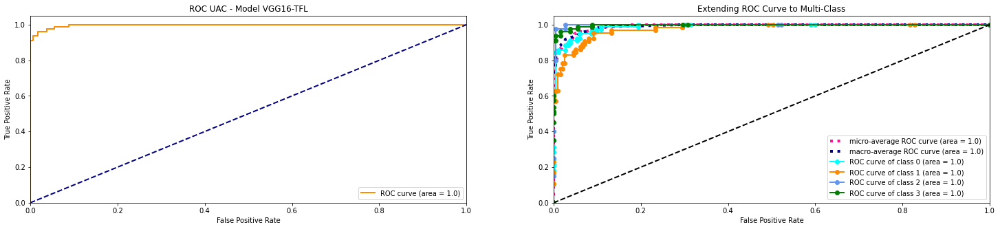

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG16/TFL/Normal/modelVGG16_tfl.h')
model_report("VGG16-TFL", model, y_test_rgb, X_test_rgb)

**VGG19 - GS**

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        77
           1       0.25      1.00      0.40        65
           2       0.00      0.00      0.00        40
           3       0.00      0.00      0.00        80

    accuracy                           0.25       262
   macro avg       0.06      0.25      0.10       262
weighted avg       0.06      0.25      0.10       262



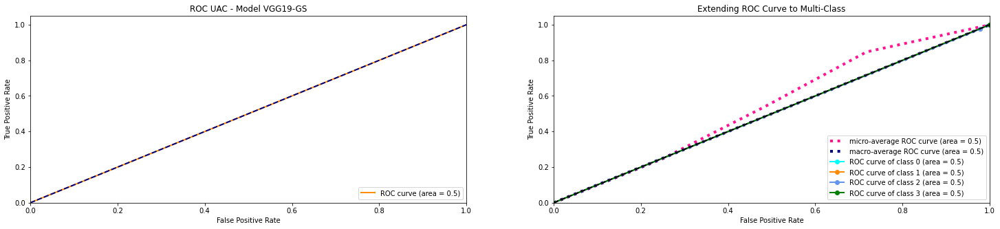

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG19/GS/Normal/modelVGG19_gs.h')
model_report("VGG19-GS", model, y_test_gs, X_test_gs)

**VGG19 - RGB**

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        77
           1       0.25      1.00      0.40        65
           2       0.00      0.00      0.00        40
           3       0.00      0.00      0.00        80

    accuracy                           0.25       262
   macro avg       0.06      0.25      0.10       262
weighted avg       0.06      0.25      0.10       262



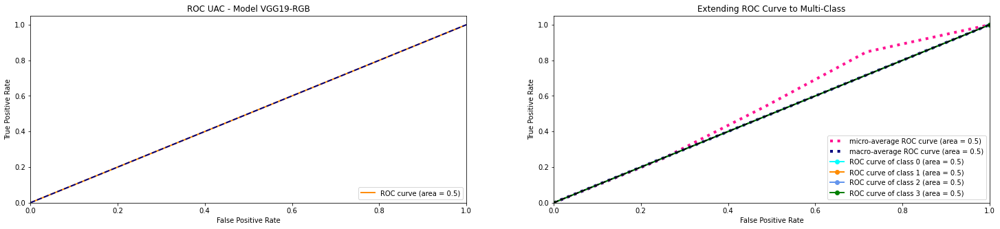

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG19/RGB/Normal/modelVGG19_rgb.h')
model_report("VGG19-RGB", model, y_test_rgb, X_test_rgb)

**VGG19 - TFL**

              precision    recall  f1-score   support

           0       0.93      0.92      0.93        77
           1       0.87      0.83      0.85        65
           2       1.00      0.97      0.99        40
           3       0.92      0.97      0.95        80

    accuracy                           0.92       262
   macro avg       0.93      0.93      0.93       262
weighted avg       0.92      0.92      0.92       262



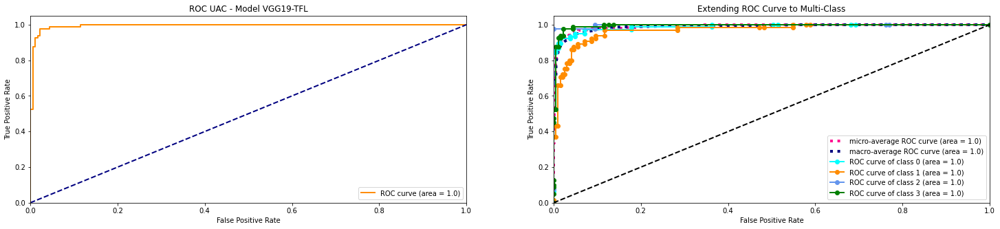

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG19/TFL/Normal/modelVGG19_tfl.h')
model_report("VGG19-TFL", model, y_test_rgb, X_test_rgb)

###ResNet

**ResNet50 - GS**

              precision    recall  f1-score   support

           0       0.71      0.91      0.80        77
           1       0.92      0.34      0.49        65
           2       0.60      0.93      0.73        40
           3       0.95      0.91      0.93        80

    accuracy                           0.77       262
   macro avg       0.79      0.77      0.74       262
weighted avg       0.82      0.77      0.75       262



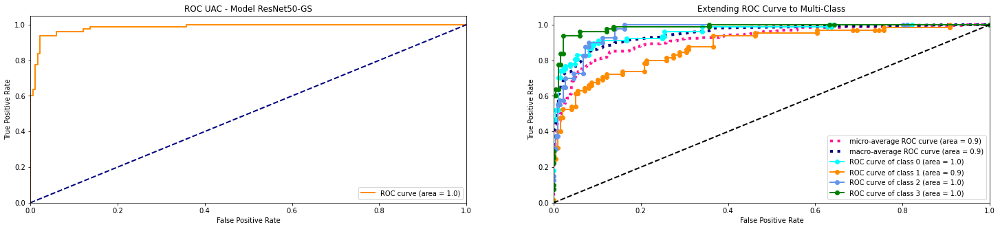

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50/GS/Normal/modelResnet50_gs.h')
model_report("ResNet50-GS", model, y_test_gs, X_test_gs)

**ResNet50 - RGB**

              precision    recall  f1-score   support

           0       0.98      0.61      0.75        77
           1       0.65      0.97      0.78        65
           2       0.86      0.80      0.83        40
           3       0.97      0.97      0.97        80

    accuracy                           0.84       262
   macro avg       0.87      0.84      0.83       262
weighted avg       0.88      0.84      0.84       262



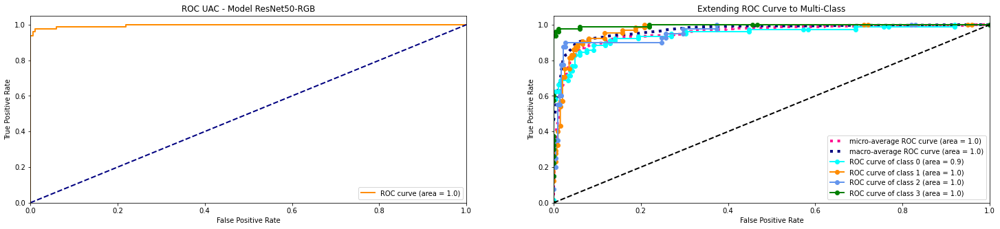

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50/RGB/Normal/modelResnet50_rgb.h')
model_report("ResNet50-RGB", model, y_test_rgb, X_test_rgb)

**ResNet50 - TFL**

              precision    recall  f1-score   support

           0       0.65      0.88      0.75        77
           1       0.81      0.54      0.65        65
           2       0.81      0.85      0.83        40
           3       0.92      0.84      0.88        80

    accuracy                           0.78       262
   macro avg       0.80      0.78      0.78       262
weighted avg       0.80      0.78      0.78       262



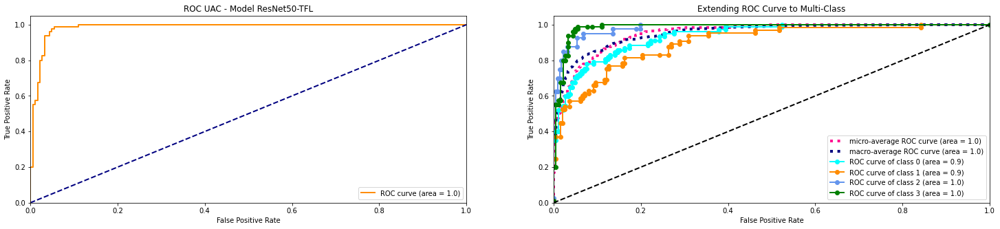

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50/TFL/Normal/modelResnet50_tfl.h')
model_report("ResNet50-TFL", model, y_test_rgb, X_test_rgb)

**ResNet101 - GS**

              precision    recall  f1-score   support

           0       0.81      0.88      0.84        77
           1       0.88      0.71      0.79        65
           2       0.88      0.93      0.90        40
           3       0.92      0.96      0.94        80

    accuracy                           0.87       262
   macro avg       0.87      0.87      0.87       262
weighted avg       0.87      0.87      0.87       262



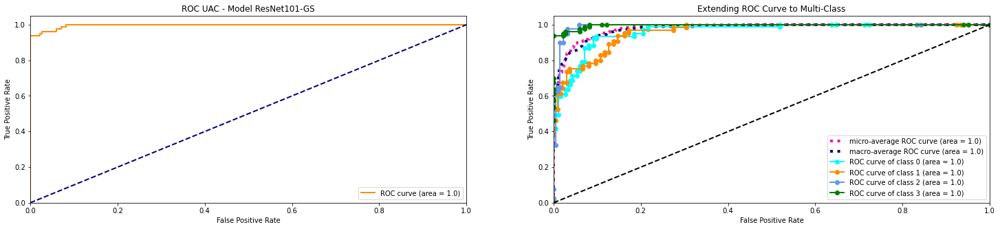

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101/GS/Normal/modelResnet101_gs.h')
model_report("ResNet101-GS", model, y_test_gs, X_test_gs)

**ResNet101 - RGB**

              precision    recall  f1-score   support

           0       0.73      0.94      0.82        77
           1       0.98      0.65      0.78        65
           2       0.88      0.88      0.88        40
           3       0.96      0.97      0.97        80

    accuracy                           0.87       262
   macro avg       0.89      0.86      0.86       262
weighted avg       0.89      0.87      0.86       262



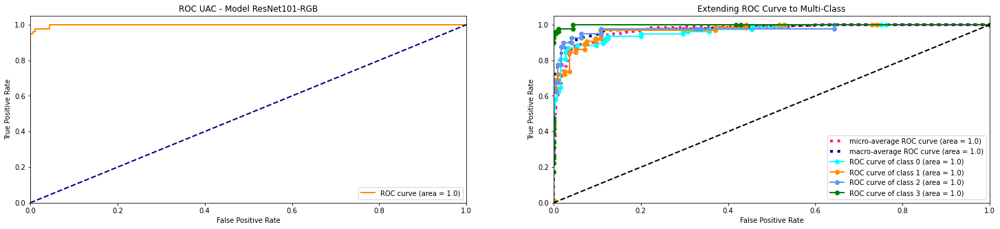

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101/RGB/Normal/modelResnet101_rgb.h')
model_report("ResNet101-RGB", model, y_test_rgb, X_test_rgb)

**ResNet101 - TFL**

              precision    recall  f1-score   support

           0       0.85      0.71      0.77        77
           1       0.77      0.82      0.79        65
           2       0.78      0.90      0.84        40
           3       0.91      0.94      0.93        80

    accuracy                           0.84       262
   macro avg       0.83      0.84      0.83       262
weighted avg       0.84      0.84      0.83       262



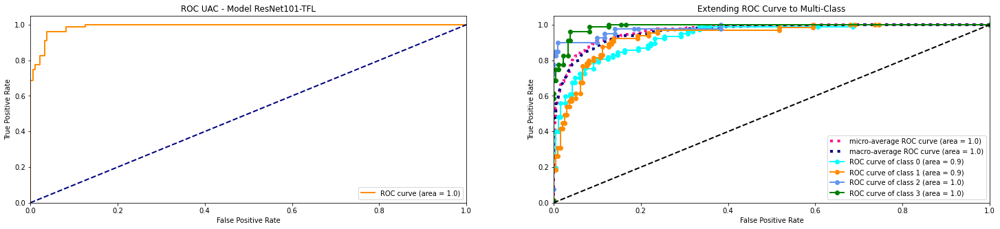

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101/TFL/Normal/modelResnet101_tfl.h')
model_report("ResNet101-TFL", model, y_test_rgb, X_test_rgb)

**ResNet152 - GS**

              precision    recall  f1-score   support

           0       1.00      0.30      0.46        77
           1       0.50      0.92      0.65        65
           2       0.89      0.80      0.84        40
           3       0.93      0.96      0.94        80

    accuracy                           0.73       262
   macro avg       0.83      0.75      0.72       262
weighted avg       0.84      0.73      0.71       262



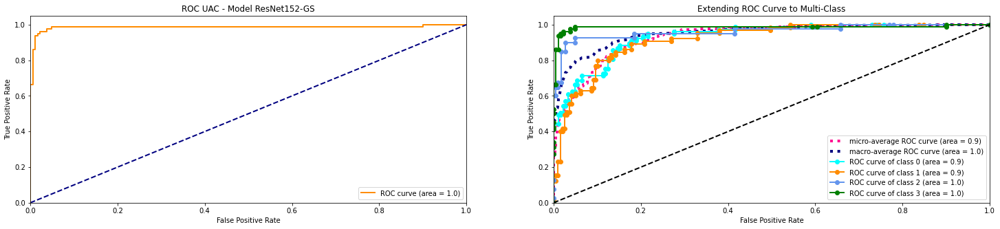

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152/GS/Normal/modelResnet152_gs.h')
model_report("ResNet152-GS", model, y_test_gs, X_test_gs)

**ResNet152 - RGB**

              precision    recall  f1-score   support

           0       0.82      0.84      0.83        77
           1       0.77      0.75      0.76        65
           2       0.79      0.82      0.80        40
           3       0.97      0.94      0.96        80

    accuracy                           0.85       262
   macro avg       0.84      0.84      0.84       262
weighted avg       0.85      0.85      0.85       262



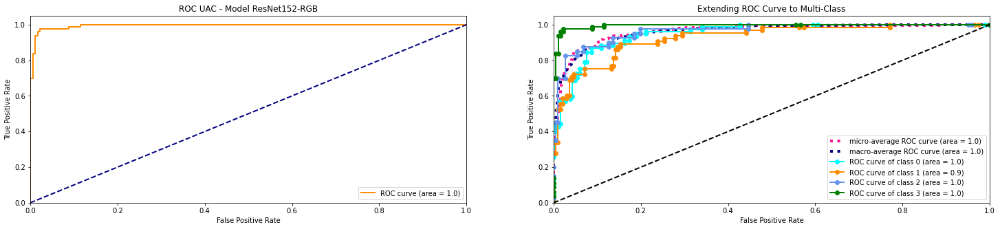

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152/RGB/Normal/modelResnet152_rgb.h')
model_report("ResNet152-RGB", model, y_test_rgb, X_test_rgb)

**ResNet152 - TFL**

              precision    recall  f1-score   support

           0       0.80      0.68      0.73        77
           1       0.74      0.71      0.72        65
           2       0.80      0.90      0.85        40
           3       0.84      0.95      0.89        80

    accuracy                           0.80       262
   macro avg       0.80      0.81      0.80       262
weighted avg       0.80      0.80      0.80       262



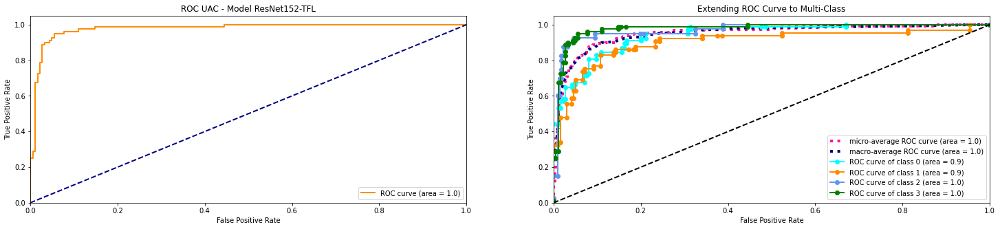

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152/TFL/Normal/modelResnet152_tfl.h')
model_report("ResNet152-TFL", model, y_test_rgb, X_test_rgb)

###ResNetV2

**ResNetV2-50 - GS**

              precision    recall  f1-score   support

           0       0.91      0.83      0.87        77
           1       0.72      0.94      0.81        65
           2       0.71      0.93      0.80        40
           3       1.00      0.69      0.81        80

    accuracy                           0.83       262
   macro avg       0.84      0.85      0.83       262
weighted avg       0.86      0.83      0.83       262



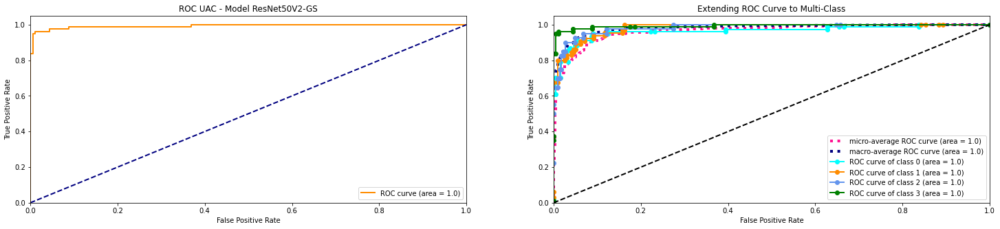

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50V2/GS/Normal/modelResnet50V2_gs.h')
model_report("ResNet50V2-GS", model, y_test_gs, X_test_gs)

**ResNetV2-50 - RGB**

              precision    recall  f1-score   support

           0       0.91      0.78      0.84        77
           1       0.91      0.77      0.83        65
           2       0.78      0.90      0.84        40
           3       0.83      0.99      0.90        80

    accuracy                           0.86       262
   macro avg       0.86      0.86      0.85       262
weighted avg       0.87      0.86      0.86       262



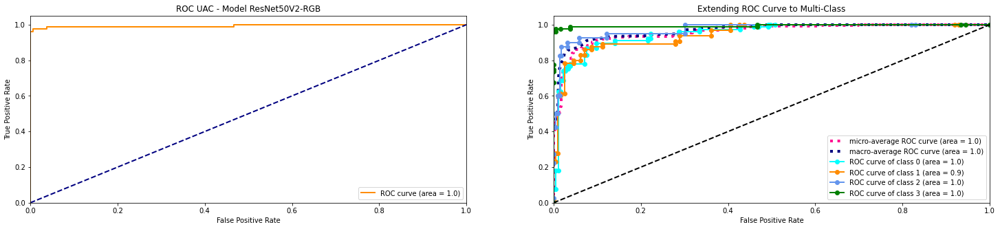

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50V2/RGB/Normal/modelResnet50V2_rgb.h')
model_report("ResNet50V2-RGB", model, y_test_rgb, X_test_rgb)

**ResNetV2-50 - TFL**

              precision    recall  f1-score   support

           0       0.86      0.86      0.86        77
           1       0.76      0.82      0.79        65
           2       1.00      0.90      0.95        40
           3       0.95      0.94      0.94        80

    accuracy                           0.88       262
   macro avg       0.89      0.88      0.88       262
weighted avg       0.88      0.88      0.88       262



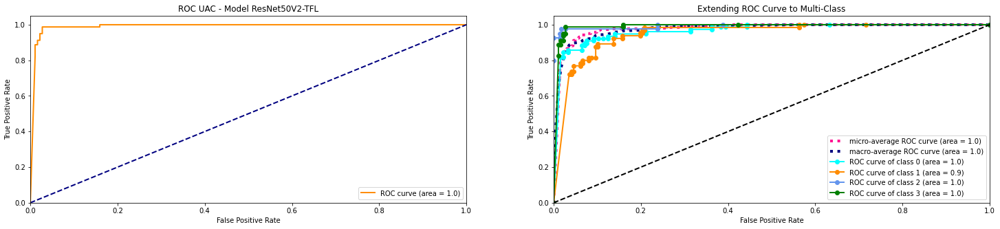

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50V2/TFL/Normal/modelResnet50V2_tfl.h')
model_report("ResNet50V2-TFL", model, y_test_rgb, X_test_rgb)

**ResNetV2-101 - GS**

              precision    recall  f1-score   support

           0       0.67      0.77      0.72        77
           1       0.68      0.49      0.57        65
           2       0.49      0.85      0.62        40
           3       0.91      0.65      0.76        80

    accuracy                           0.68       262
   macro avg       0.69      0.69      0.67       262
weighted avg       0.72      0.68      0.68       262



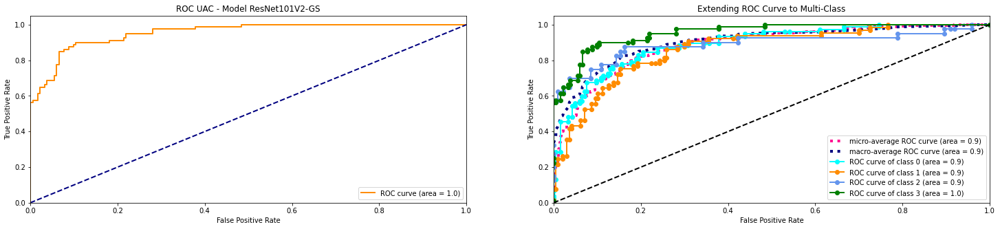

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101V2/GS/Normal/modelResnet101V2_gs.h')
model_report("ResNet101V2-GS", model, y_test_gs, X_test_gs)

**ResNetV2-101 - RGB**

              precision    recall  f1-score   support

           0       0.88      0.79      0.84        77
           1       0.96      0.68      0.79        65
           2       0.39      0.95      0.55        40
           3       1.00      0.61      0.76        80

    accuracy                           0.73       262
   macro avg       0.81      0.76      0.73       262
weighted avg       0.86      0.73      0.76       262



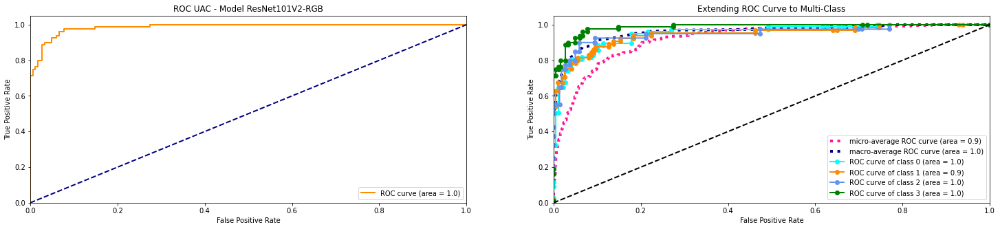

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101V2/RGB/Normal/modelResnet101V2_rgb.h')
model_report("ResNet101V2-RGB", model, y_test_rgb, X_test_rgb)

**ResNetV2-101 - TFL**

              precision    recall  f1-score   support

           0       0.91      0.90      0.90        77
           1       0.80      0.85      0.82        65
           2       0.97      0.90      0.94        40
           3       0.93      0.93      0.93        80

    accuracy                           0.89       262
   macro avg       0.90      0.89      0.90       262
weighted avg       0.90      0.89      0.89       262



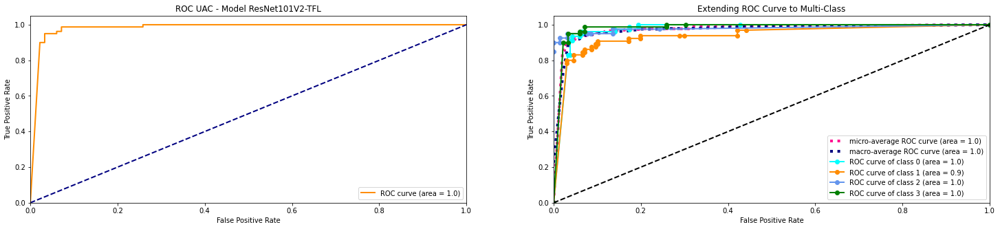

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101V2/TFL/Normal/modelResnet101V2_tfl.h')
model_report("ResNet101V2-TFL", model, y_test_rgb, X_test_rgb)

**ResNetV2-152 - GS**

              precision    recall  f1-score   support

           0       0.73      0.94      0.82        77
           1       0.89      0.65      0.75        65
           2       0.71      0.85      0.77        40
           3       0.96      0.81      0.88        80

    accuracy                           0.81       262
   macro avg       0.82      0.81      0.80       262
weighted avg       0.84      0.81      0.81       262



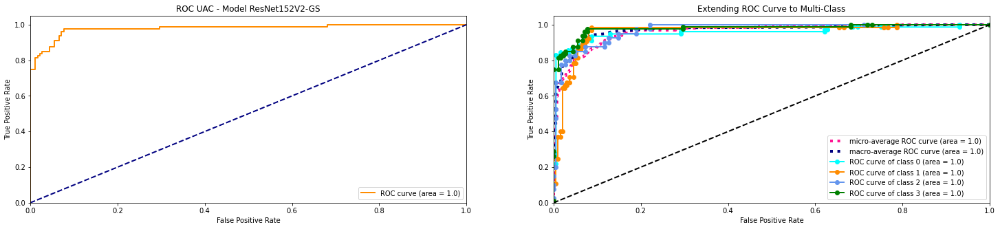

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152V2/GS/Normal/modelResnet152V2_gs.h')
model_report("ResNet152V2-GS", model, y_test_gs, X_test_gs)

**ResNetV2-152 - RGB**

              precision    recall  f1-score   support

           0       0.95      0.78      0.86        77
           1       0.67      0.98      0.80        65
           2       0.97      0.78      0.86        40
           3       0.97      0.88      0.92        80

    accuracy                           0.86       262
   macro avg       0.89      0.85      0.86       262
weighted avg       0.89      0.86      0.86       262



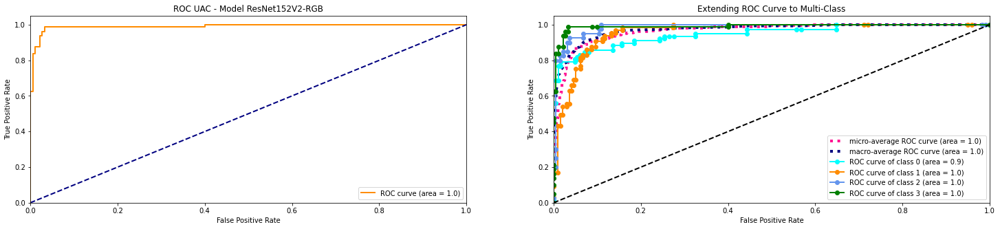

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152V2/RGB/Normal/modelResnet152V2_rgb.h')
model_report("ResNet152V2-RGB", model, y_test_rgb, X_test_rgb)

**ResNetV2-152 - TFL**

              precision    recall  f1-score   support

           0       0.91      0.79      0.85        77
           1       0.78      0.82      0.80        65
           2       0.95      0.93      0.94        40
           3       0.90      0.99      0.94        80

    accuracy                           0.88       262
   macro avg       0.88      0.88      0.88       262
weighted avg       0.88      0.88      0.88       262



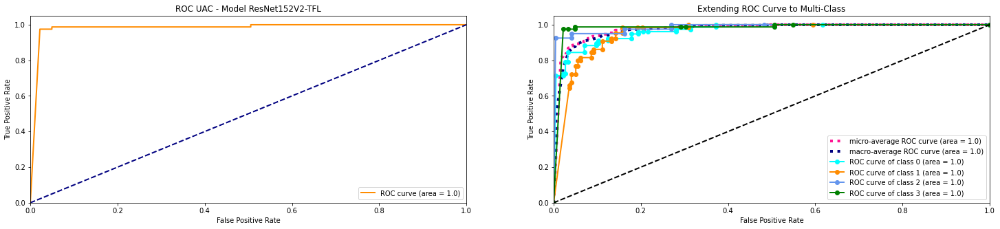

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152V2/TFL/Normal/modelResnet152V2_tfl.h')
model_report("ResNet152V2-TFL", model, y_test_rgb, X_test_rgb)

###Xception

**GS**

              precision    recall  f1-score   support

           0       0.88      0.90      0.89        77
           1       0.86      0.88      0.87        65
           2       0.92      0.85      0.88        40
           3       0.95      0.96      0.96        80

    accuracy                           0.90       262
   macro avg       0.90      0.90      0.90       262
weighted avg       0.90      0.90      0.90       262



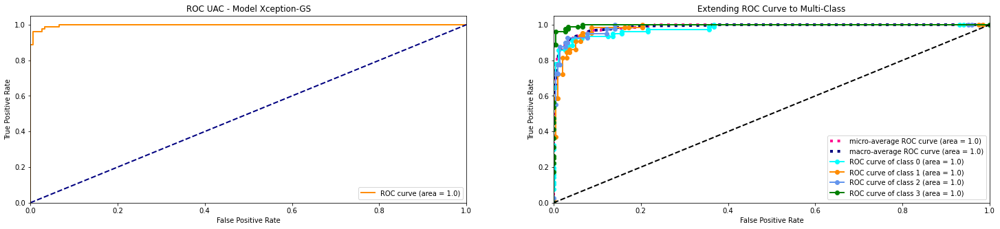

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/Xception/GS/Normal/modelXception_gs.h')
model_report("Xception-GS", model, y_test_gs, X_test_gs)

**RGB**

              precision    recall  f1-score   support

           0       0.90      0.92      0.91        77
           1       0.95      0.92      0.94        65
           2       0.92      0.85      0.88        40
           3       0.94      0.97      0.96        80

    accuracy                           0.93       262
   macro avg       0.93      0.92      0.92       262
weighted avg       0.93      0.93      0.93       262



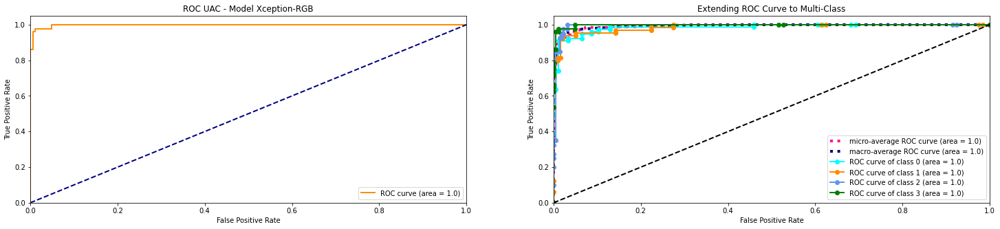

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/Xception/RGB/Normal/modelXception_rgb.h')
model_report("Xception-RGB", model, y_test_rgb, X_test_rgb)

**TFL**

              precision    recall  f1-score   support

           0       0.97      0.94      0.95        77
           1       0.94      0.95      0.95        65
           2       0.97      0.97      0.97        40
           3       0.98      1.00      0.99        80

    accuracy                           0.97       262
   macro avg       0.97      0.97      0.97       262
weighted avg       0.97      0.97      0.97       262



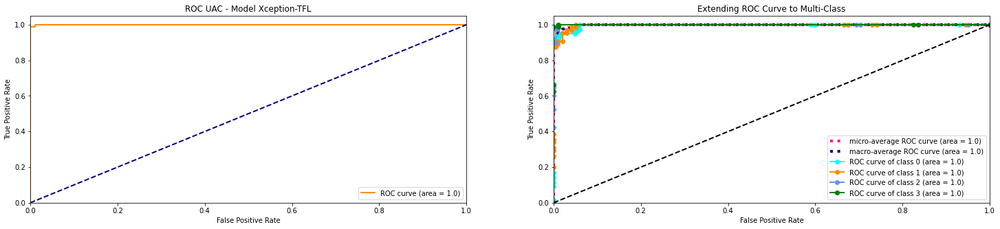

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/Xception/TFL/Normal/modelXception_tfl.h')
model_report("Xception-TFL", model, y_test_rgb, X_test_rgb)

##Data Augmentation

###Custom

**GS**

              precision    recall  f1-score   support

           0       1.00      0.57      0.73        77
           1       0.64      0.78      0.70        65
           2       0.65      0.97      0.78        40
           3       0.95      0.93      0.94        80

    accuracy                           0.79       262
   macro avg       0.81      0.81      0.79       262
weighted avg       0.84      0.79      0.79       262



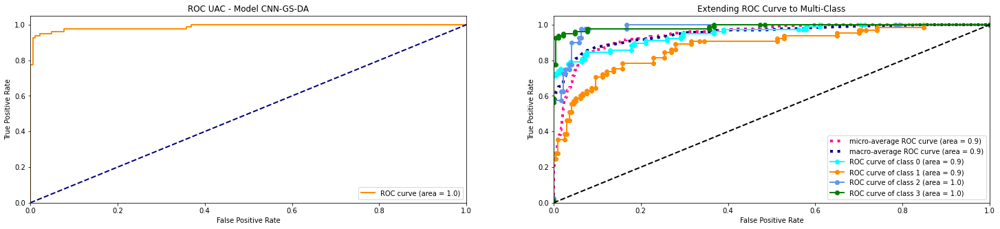

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/CNN/GS/DataAugmentation/modelCNN_gs_da.h')
model_report("CNN-GS-DA", model, y_test_gs, X_test_gs)

**RGB**

              precision    recall  f1-score   support

           0       0.85      0.87      0.86        77
           1       0.86      0.65      0.74        65
           2       0.79      0.93      0.85        40
           3       0.89      0.96      0.92        80

    accuracy                           0.85       262
   macro avg       0.84      0.85      0.84       262
weighted avg       0.85      0.85      0.85       262



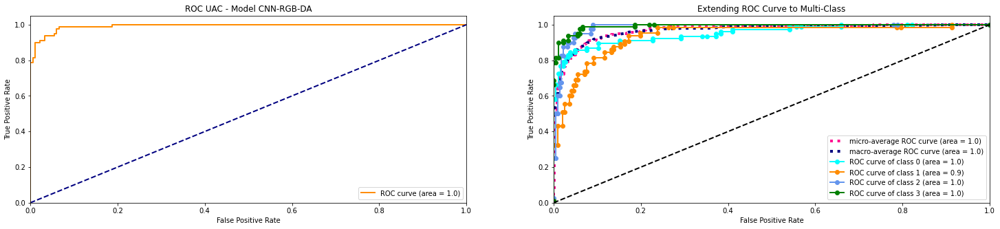

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/CNN/RGB/DataAugmentation/modelCNN_rgb_da.h')
model_report("CNN-RGB-DA", model, y_test_rgb, X_test_rgb)

###VGG

**VGG16 - GS**

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        77
           1       0.25      1.00      0.40        65
           2       0.00      0.00      0.00        40
           3       0.00      0.00      0.00        80

    accuracy                           0.25       262
   macro avg       0.06      0.25      0.10       262
weighted avg       0.06      0.25      0.10       262



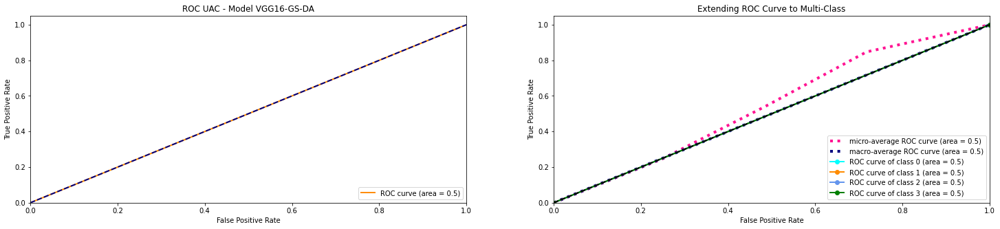

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG16/GS/DataAugmentation/modelVGG16_gs_da.h')
model_report("VGG16-GS-DA", model, y_test_gs, X_test_gs)

**VGG16 - RGB**

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        77
           1       0.25      1.00      0.40        65
           2       0.00      0.00      0.00        40
           3       0.00      0.00      0.00        80

    accuracy                           0.25       262
   macro avg       0.06      0.25      0.10       262
weighted avg       0.06      0.25      0.10       262



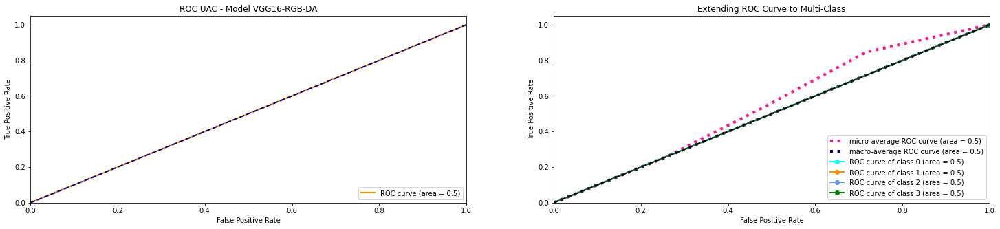

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG16/RGB/DataAugmentation/modelVGG16_rgb_da.h')
model_report("VGG16-RGB-DA", model, y_test_rgb, X_test_rgb)

**VGG16 - TFL**

              precision    recall  f1-score   support

           0       0.91      0.75      0.82        77
           1       0.74      0.82      0.77        65
           2       0.75      0.90      0.82        40
           3       0.91      0.89      0.90        80

    accuracy                           0.83       262
   macro avg       0.83      0.84      0.83       262
weighted avg       0.84      0.83      0.83       262



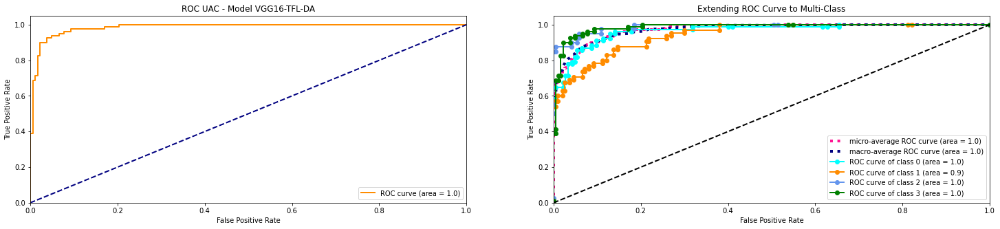

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG16/TFL/DataAugmentation/modelVGG16_tfl_da.h')
model_report("VGG16-TFL-DA", model, y_test_rgb, X_test_rgb)

**VGG19 - GS**

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        77
           1       0.25      1.00      0.40        65
           2       0.00      0.00      0.00        40
           3       0.00      0.00      0.00        80

    accuracy                           0.25       262
   macro avg       0.06      0.25      0.10       262
weighted avg       0.06      0.25      0.10       262



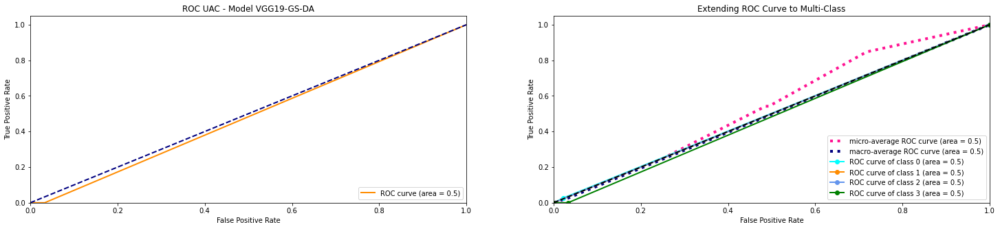

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG19/GS/DataAugmentation/modelVGG19_gs_da.h')
model_report("VGG19-GS-DA", model, y_test_gs, X_test_gs)

**VGG19 - RGB**

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        77
           1       0.25      1.00      0.40        65
           2       0.00      0.00      0.00        40
           3       0.00      0.00      0.00        80

    accuracy                           0.25       262
   macro avg       0.06      0.25      0.10       262
weighted avg       0.06      0.25      0.10       262



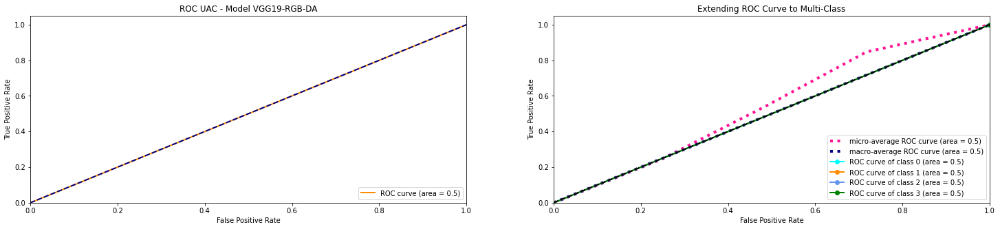

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG19/RGB/DataAugmentation/modelVGG19_rgb_da.h')
model_report("VGG19-RGB-DA", model, y_test_rgb, X_test_rgb)

**VGG19 - TFL**

              precision    recall  f1-score   support

           0       0.84      0.77      0.80        77
           1       0.72      0.68      0.70        65
           2       0.70      0.93      0.80        40
           3       0.96      0.94      0.95        80

    accuracy                           0.82       262
   macro avg       0.81      0.83      0.81       262
weighted avg       0.83      0.82      0.82       262



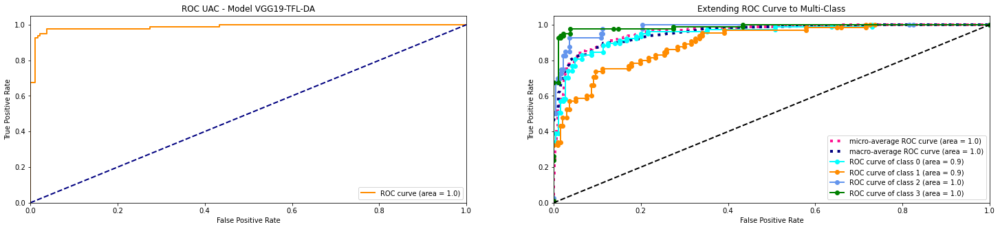

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG19/TFL/DataAugmentation/modelVGG19_tfl_da.h')
model_report("VGG19-TFL-DA", model, y_test_rgb, X_test_rgb)

###ResNet

**ResNet50 - GS**

              precision    recall  f1-score   support

           0       0.98      0.65      0.78        77
           1       0.51      0.88      0.65        65
           2       0.71      0.97      0.82        40
           3       1.00      0.56      0.72        80

    accuracy                           0.73       262
   macro avg       0.80      0.77      0.74       262
weighted avg       0.83      0.73      0.74       262



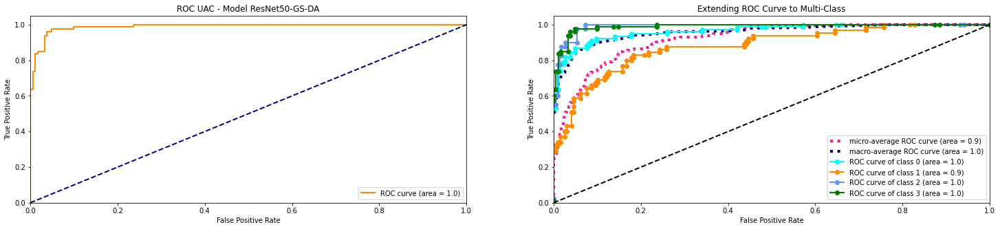

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50/GS/DataAugmentation/modelResnet50_gs_da.h')
model_report("ResNet50-GS-DA", model, y_test_gs, X_test_gs)

**ResNet50 - RGB**

              precision    recall  f1-score   support

           0       0.68      0.95      0.79        77
           1       0.89      0.63      0.74        65
           2       0.83      0.62      0.71        40
           3       0.94      0.91      0.92        80

    accuracy                           0.81       262
   macro avg       0.83      0.78      0.79       262
weighted avg       0.83      0.81      0.81       262



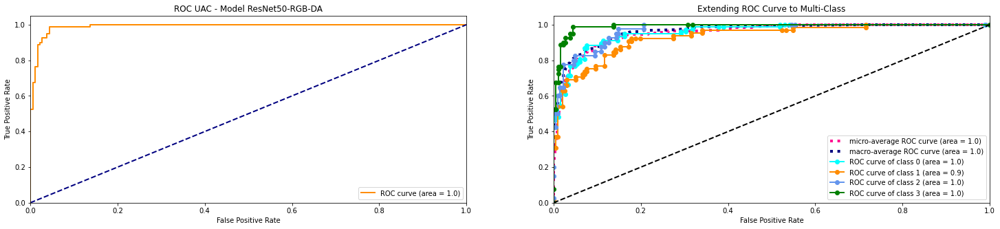

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50/RGB/DataAugmentation/modelResnet50_rgb_da.h')
model_report("ResNet50-RGB-DA", model, y_test_rgb, X_test_rgb)

**ResNet50 - TFL**

              precision    recall  f1-score   support

           0       0.65      0.58      0.62        77
           1       0.45      0.58      0.51        65
           2       0.66      0.68      0.67        40
           3       0.63      0.53      0.57        80

    accuracy                           0.58       262
   macro avg       0.60      0.59      0.59       262
weighted avg       0.59      0.58      0.58       262



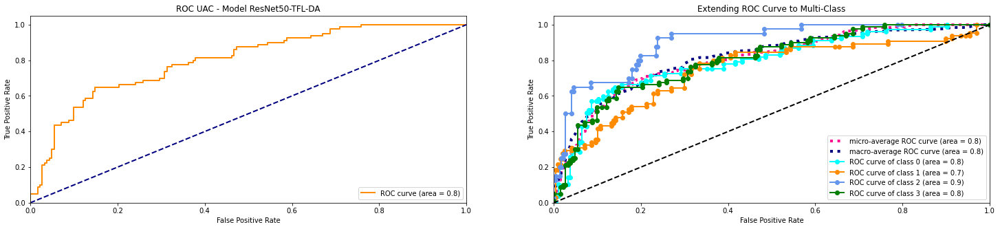

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50/TFL/DataAugmentation/modelResnet50_tfl_da.h')
model_report("ResNet50-TFL-DA", model, y_test_rgb, X_test_rgb)

**ResNet101 - GS**

              precision    recall  f1-score   support

           0       0.90      0.81      0.85        77
           1       0.83      0.77      0.80        65
           2       0.62      0.88      0.73        40
           3       0.97      0.94      0.96        80

    accuracy                           0.85       262
   macro avg       0.83      0.85      0.83       262
weighted avg       0.86      0.85      0.85       262



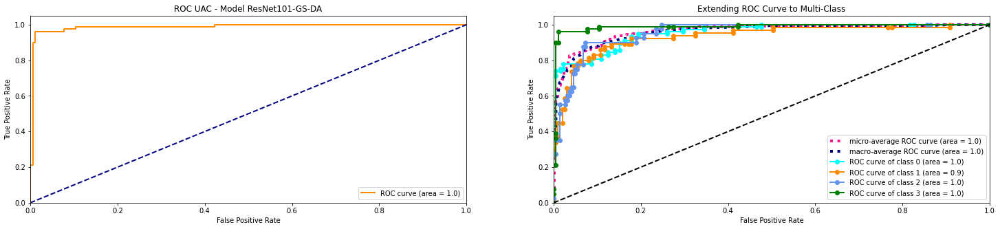

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101/GS/DataAugmentation/modelResnet101_gs_da.h')
model_report("ResNet101-GS-DA", model, y_test_gs, X_test_gs)

**ResNet101 - RGB**

              precision    recall  f1-score   support

           0       0.93      0.70      0.80        77
           1       0.52      0.85      0.64        65
           2       0.71      0.80      0.75        40
           3       0.94      0.62      0.75        80

    accuracy                           0.73       262
   macro avg       0.78      0.74      0.74       262
weighted avg       0.80      0.73      0.74       262



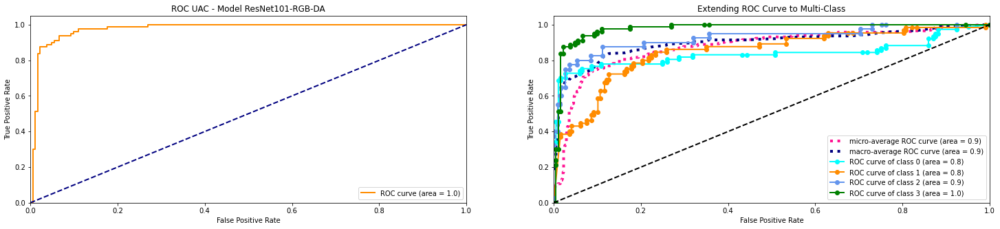

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101/RGB/DataAugmentation/modelResnet101_rgb_da.h')
model_report("ResNet101-RGB-DA", model, y_test_rgb, X_test_rgb)

**ResNet101 - TFL**

              precision    recall  f1-score   support

           0       0.53      0.55      0.54        77
           1       0.37      0.62      0.46        65
           2       0.60      0.68      0.64        40
           3       0.77      0.29      0.42        80

    accuracy                           0.50       262
   macro avg       0.57      0.53      0.51       262
weighted avg       0.57      0.50      0.50       262



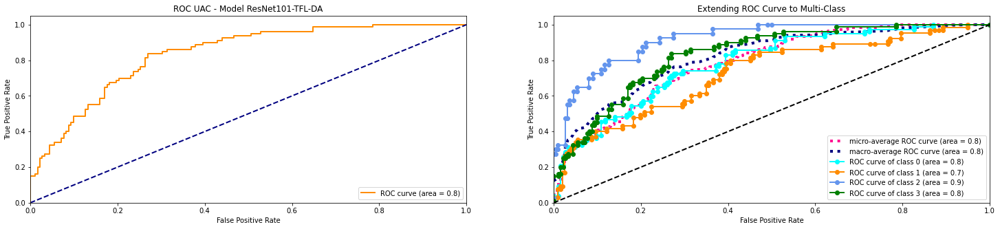

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101/TFL/DataAugmentation/modelResnet101_tfl_da.h')
model_report("ResNet101-TFL-DA", model, y_test_rgb, X_test_rgb)

**ResNet152 - GS**

              precision    recall  f1-score   support

           0       0.60      0.04      0.07        77
           1       0.50      0.22      0.30        65
           2       1.00      0.35      0.52        40
           3       0.37      1.00      0.54        80

    accuracy                           0.42       262
   macro avg       0.62      0.40      0.36       262
weighted avg       0.57      0.42      0.34       262



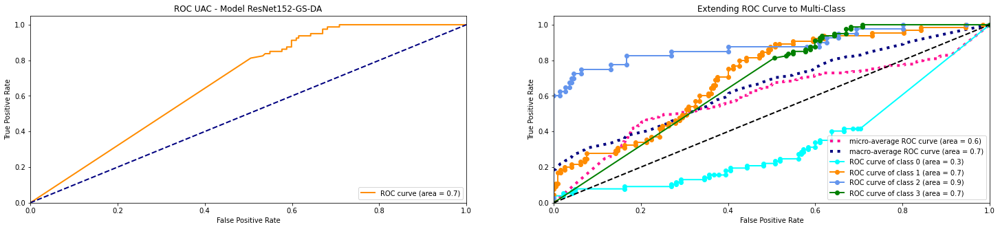

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152/GS/DataAugmentation/modelResnet152_gs_da.h')
model_report("ResNet152-GS-DA", model, y_test_gs, X_test_gs)

**ResNet152 - RGB**

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.88      0.56      0.68        77
           1       0.32      0.95      0.48        65
           2       0.77      0.42      0.55        40
           3       0.00      0.00      0.00        80

    accuracy                           0.47       262
   macro avg       0.49      0.48      0.43       262
weighted avg       0.46      0.47      0.40       262



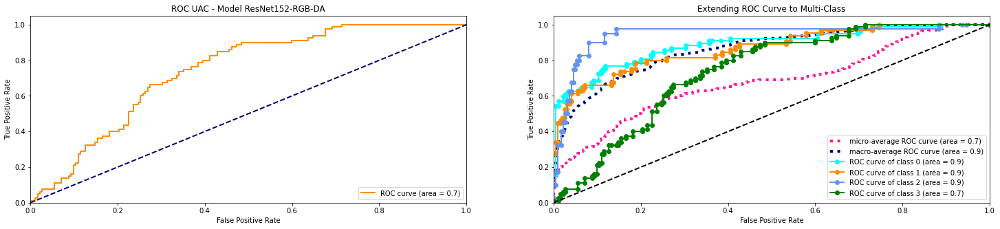

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152/RGB/DataAugmentation/modelResnet152_rgb_da.h')
model_report("ResNet152-RGB-DA", model, y_test_rgb, X_test_rgb)

**ResNet152 - TFL**

              precision    recall  f1-score   support

           0       0.50      0.55      0.52        77
           1       0.35      0.78      0.49        65
           2       0.77      0.25      0.38        40
           3       0.80      0.20      0.32        80

    accuracy                           0.45       262
   macro avg       0.61      0.45      0.43       262
weighted avg       0.60      0.45      0.43       262



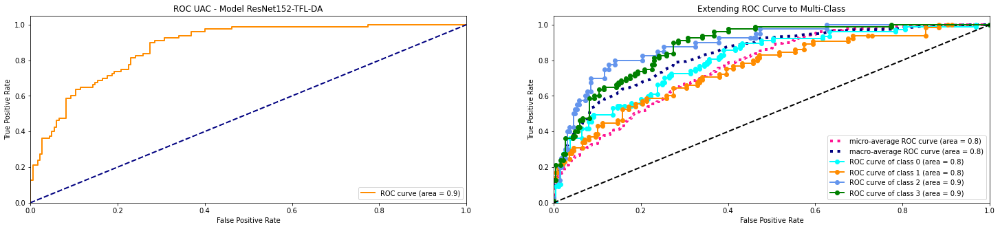

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152/TFL/DataAugmentation/modelResnet152_tfl_da.h')
model_report("ResNet152-TFL-DA", model, y_test_rgb, X_test_rgb)

###ResNetV2

**ResNetV2-50 - GS**

              precision    recall  f1-score   support

           0       0.88      0.94      0.91        77
           1       0.93      0.86      0.90        65
           2       0.92      0.88      0.90        40
           3       0.95      0.97      0.96        80

    accuracy                           0.92       262
   macro avg       0.92      0.91      0.92       262
weighted avg       0.92      0.92      0.92       262



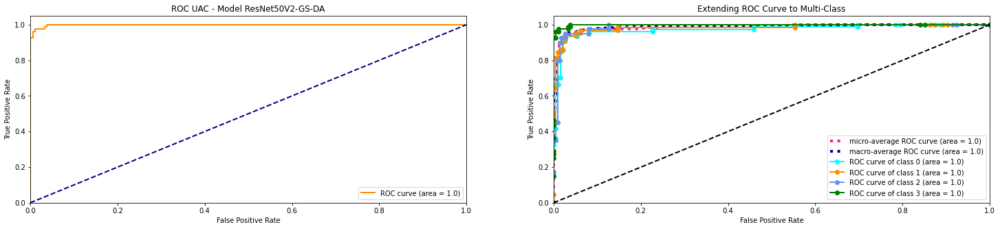

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50V2/GS/DataAugmentation/modelResnet50V2_gs_da.h')
model_report("ResNet50V2-GS-DA", model, y_test_gs, X_test_gs)

**ResNetV2-50 - RGB**

              precision    recall  f1-score   support

           0       0.85      0.91      0.88        77
           1       0.85      0.85      0.85        65
           2       0.82      0.80      0.81        40
           3       1.00      0.95      0.97        80

    accuracy                           0.89       262
   macro avg       0.88      0.88      0.88       262
weighted avg       0.89      0.89      0.89       262



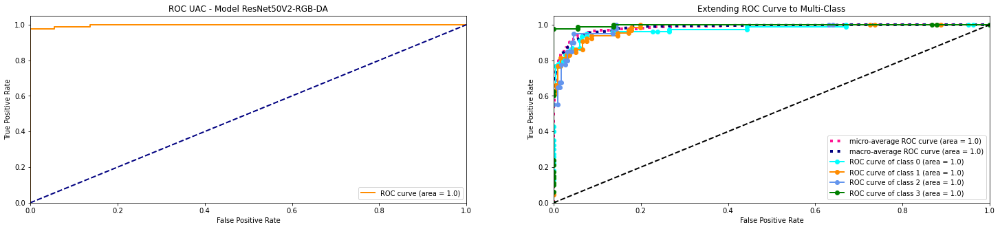

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50V2/RGB/DataAugmentation/modelResnet50V2_rgb_da.h')
model_report("ResNet50V2-RGB-DA", model, y_test_rgb, X_test_rgb)

**ResNetV2-50 - TFL**

              precision    recall  f1-score   support

           0       0.83      0.81      0.82        77
           1       0.64      0.77      0.70        65
           2       0.97      0.85      0.91        40
           3       0.91      0.84      0.87        80

    accuracy                           0.81       262
   macro avg       0.84      0.82      0.82       262
weighted avg       0.83      0.81      0.82       262



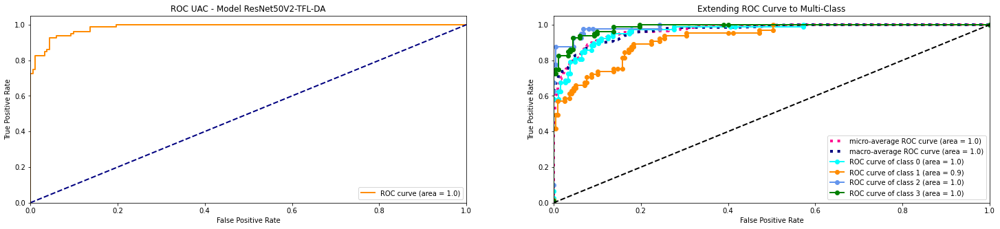

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet50V2/TFL/DataAugmentation/modelResnet50V2_tfl_da.h')
model_report("ResNet50V2-TFL-DA", model, y_test_rgb, X_test_rgb)

**ResNetV2-101 - GS**

              precision    recall  f1-score   support

           0       0.97      0.49      0.66        77
           1       0.62      0.97      0.76        65
           2       0.59      0.85      0.69        40
           3       0.97      0.78      0.86        80

    accuracy                           0.75       262
   macro avg       0.79      0.77      0.74       262
weighted avg       0.83      0.75      0.75       262



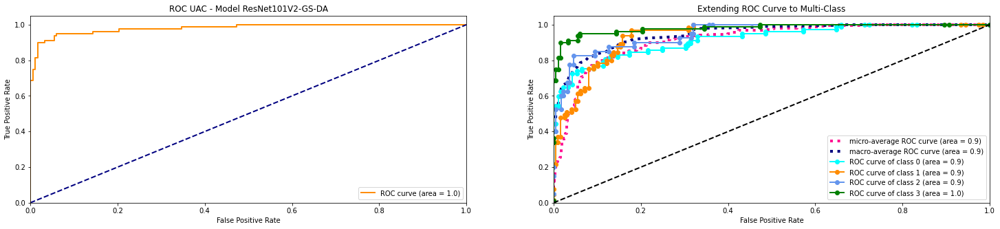

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101V2/GS/DataAugmentation/modelResnet101V2_gs_da.h')
model_report("ResNet101V2-GS-DA", model, y_test_gs, X_test_gs)

**ResNetV2-101 - RGB**

              precision    recall  f1-score   support

           0       0.84      0.94      0.88        77
           1       0.84      0.88      0.86        65
           2       0.88      0.75      0.81        40
           3       0.97      0.90      0.94        80

    accuracy                           0.88       262
   macro avg       0.88      0.87      0.87       262
weighted avg       0.89      0.88      0.88       262



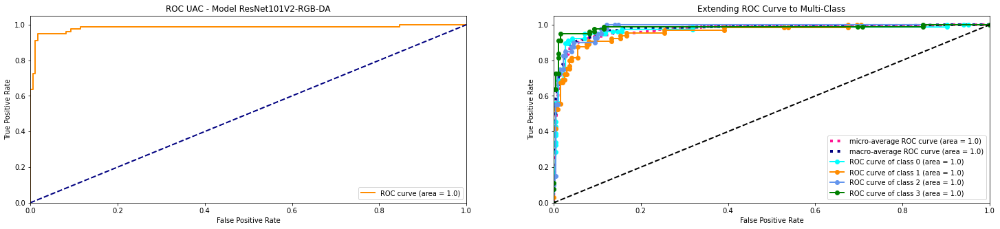

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101V2/RGB/DataAugmentation/modelResnet101V2_rgb_da.h')
model_report("ResNet101V2-RGB-DA", model, y_test_rgb, X_test_rgb)

**ResNetV2-101 - TFL**

              precision    recall  f1-score   support

           0       0.84      0.81      0.82        77
           1       0.78      0.75      0.77        65
           2       0.95      0.88      0.91        40
           3       0.88      0.96      0.92        80

    accuracy                           0.85       262
   macro avg       0.86      0.85      0.85       262
weighted avg       0.85      0.85      0.85       262



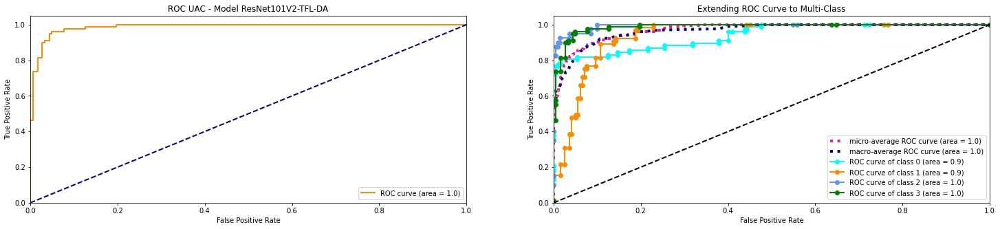

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet101V2/TFL/DataAugmentation/modelResnet101V2_tfl_da.h')
model_report("ResNet101V2-TFL-DA", model, y_test_rgb, X_test_rgb)

**ResNetV2-152 - GS**

              precision    recall  f1-score   support

           0       0.94      0.75      0.83        77
           1       0.73      0.91      0.81        65
           2       0.74      0.78      0.76        40
           3       0.99      0.95      0.97        80

    accuracy                           0.85       262
   macro avg       0.85      0.85      0.84       262
weighted avg       0.87      0.85      0.86       262



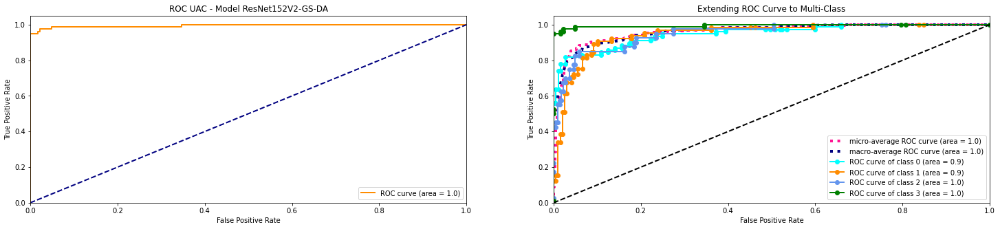

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152V2/GS/DataAugmentation/modelResnet152V2_gs_da.h')
model_report("ResNet152V2-GS-DA", model, y_test_gs, X_test_gs)

**ResNetV2-152 - RGB**

              precision    recall  f1-score   support

           0       0.72      0.69      0.70        77
           1       0.92      0.35      0.51        65
           2       0.33      1.00      0.50        40
           3       0.90      0.47      0.62        80

    accuracy                           0.59       262
   macro avg       0.72      0.63      0.58       262
weighted avg       0.77      0.59      0.60       262



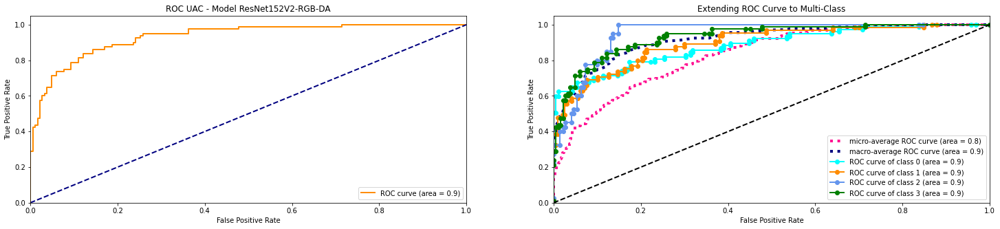

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152V2/RGB/DataAugmentation/modelResnet152V2_rgb_da.h')
model_report("ResNet152V2-RGB-DA", model, y_test_rgb, X_test_rgb)

**ResNetV2-152 - TFL**

              precision    recall  f1-score   support

           0       0.80      0.71      0.75        77
           1       0.62      0.85      0.71        65
           2       1.00      0.78      0.87        40
           3       0.96      0.88      0.92        80

    accuracy                           0.81       262
   macro avg       0.84      0.80      0.81       262
weighted avg       0.83      0.81      0.81       262



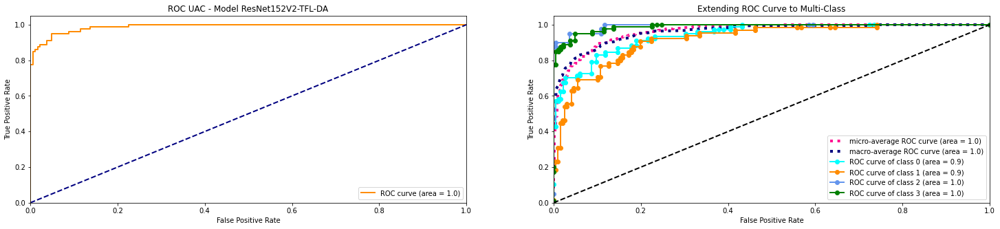

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/ResNet152V2/TFL/DataAugmentation/modelResnet152V2_tfl_da.h')
model_report("ResNet152V2-TFL-DA", model, y_test_rgb, X_test_rgb)

###Xception

**GS**

              precision    recall  f1-score   support

           0       0.88      0.94      0.91        77
           1       0.88      0.89      0.89        65
           2       0.97      0.93      0.95        40
           3       1.00      0.95      0.97        80

    accuracy                           0.93       262
   macro avg       0.93      0.93      0.93       262
weighted avg       0.93      0.93      0.93       262



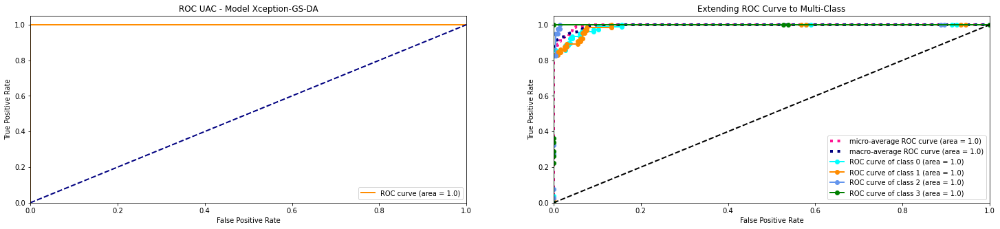

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/Xception/GS/DataAugmentation/modelXception_gs_da.h')
model_report("Xception-GS-DA", model, y_test_gs, X_test_gs)

**RGB**

              precision    recall  f1-score   support

           0       0.56      0.97      0.71        77
           1       0.94      0.46      0.62        65
           2       0.89      0.82      0.86        40
           3       1.00      0.75      0.86        80

    accuracy                           0.76       262
   macro avg       0.85      0.75      0.76       262
weighted avg       0.84      0.76      0.76       262



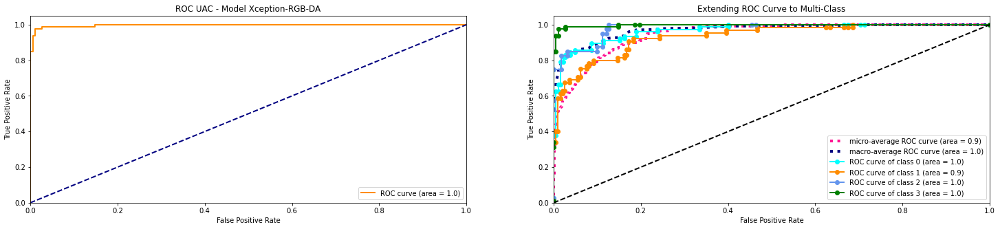

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/Xception/RGB/DataAugmentation/modelXception_rgb_da.h')
model_report("Xception-RGB-DA", model, y_test_rgb, X_test_rgb)

**TFL**

In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/Xception/TFL/DataAugmentation/modelXception_tfl_da.h')
model_report("Xception-TFL-DA", model, y_test_rgb, X_test_rgb)

#Printing for Explanations


In [ ]:
model = load_model('/content/drive/MyDrive/tfg/results/VGG16/TFL/Normal/modelVGG16_tfl.h')

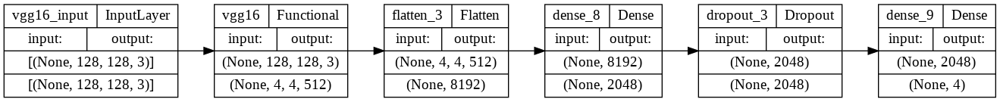

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model_plot.png', show_shapes=True, rankdir="LR")